<h1><U><center> ELECTRICITY net_demand

**Importing Libraries**

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from datetime import datetime
from matplotlib import style
import warnings
warnings.filterwarnings('ignore')

**Loading the Dataset**

In [2]:
def change_format(x):
    return datetime.strptime(x,'%Y-%m-%d %H:%M:%S')

In [3]:
df=pd.read_csv('net_demand.csv',parse_dates=['datetime'],date_parser=change_format)

In [4]:
df.head(3)

,datetime,net_demand
0,2015-01-03 01:00:00,970.3450
1,2015-01-03 02:00:00,912.1755
2,2015-01-03 03:00:00,900.2688


In [5]:
X=df.copy()

In [6]:
X.isna().sum()

datetime       0
net_demand    50
dtype: int64

## 1.1. Outlier 

In [7]:
def outlier_show(col):
    print("Highest allowed (99% boundary)",X[col].mean() + 3*X[col].std())
    print("Lowest allowed (1% boundary)",X[col].mean() - 3*X[col].std())
    high = X[col].mean() + 3*X[col].std()
    low = X[col].mean() - 3*X[col].std()
    print('Outliers(based on ( '+str(col)+' ) :')
    return(X[(X[col] > high) | (X[col] < low)])

In [8]:
outliers=outlier_show('net_demand')
outliers

Highest allowed (99% boundary) 1758.9962460095985
Lowest allowed (1% boundary) 606.7066400698822
Outliers(based on ( net_demand ) :


,datetime,net_demand
520,2015-01-24 17:00:00,509.8358
21755,2017-06-27 12:00:00,380.5936
21853,2017-07-01 14:00:00,560.7009
35483,2019-01-20 12:00:00,85.1925
35484,2019-01-20 13:00:00,135.7636
35485,2019-01-20 14:00:00,263.6183
35486,2019-01-20 15:00:00,417.4492
35487,2019-01-20 16:00:00,475.8024


In [9]:
outliers.set_index('datetime')

,net_demand
datetime,
2015-01-24 17:00:00,509.8358
2017-06-27 12:00:00,380.5936
2017-07-01 14:00:00,560.7009
2019-01-20 12:00:00,85.1925
2019-01-20 13:00:00,135.7636
2019-01-20 14:00:00,263.6183
2019-01-20 15:00:00,417.4492
2019-01-20 16:00:00,475.8024


In [10]:
outliers.datetime

520     2015-01-24 17:00:00
21755   2017-06-27 12:00:00
21853   2017-07-01 14:00:00
35483   2019-01-20 12:00:00
35484   2019-01-20 13:00:00
35485   2019-01-20 14:00:00
35486   2019-01-20 15:00:00
35487   2019-01-20 16:00:00
Name: datetime, dtype: datetime64[ns]

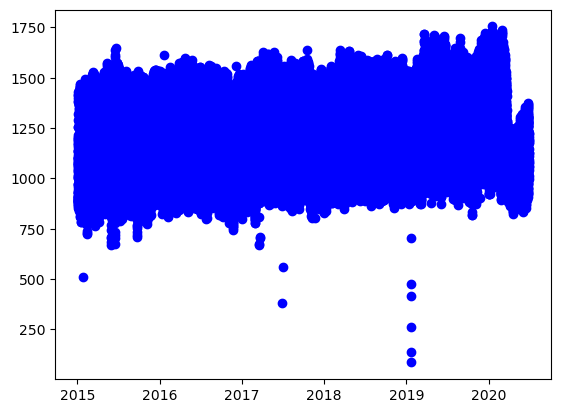

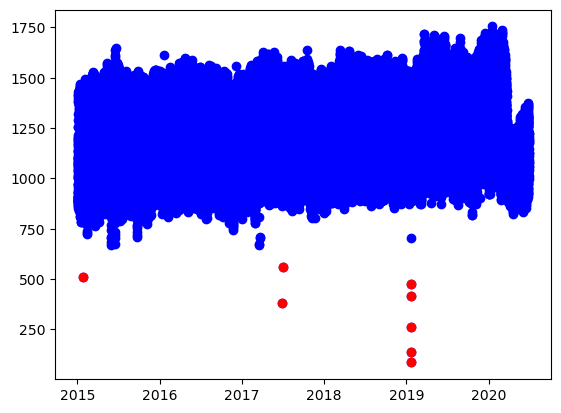

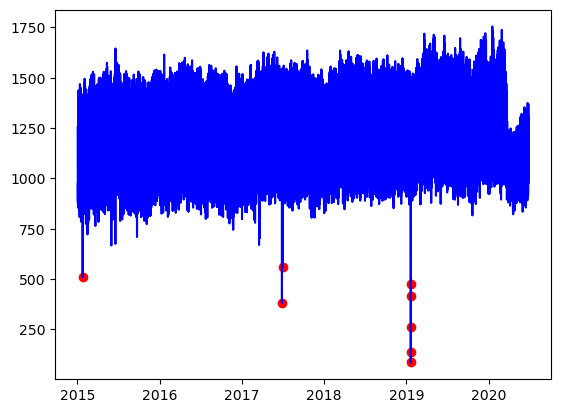

In [11]:
plt.scatter(X.datetime,X.net_demand,color='blue')
plt.show()
plt.scatter(X.datetime,X.net_demand,color='blue')
plt.scatter(outliers.datetime,outliers.net_demand,color='red')
plt.show()
plt.plot(X.datetime,X.net_demand,color='blue')
plt.scatter(outliers.datetime,outliers.net_demand,color='red')
plt.show()

In [12]:
X.net_demand.mean()

1182.8514430397404

In [13]:
for i in outliers.index:
    print('Before : '+str(X.iloc[i,:].net_demand))
    X.iloc[i,1:]=X.net_demand.mean()
    print('After : '+str(X.iloc[i,:].net_demand))

Before : 509.8358
After : 1182.8514430397404
Before : 380.5936
After : 1182.8654647832097
Before : 560.7008999999999
After : 1182.8821794768382
Before : 85.19250000000002
After : 1182.8951421269378
Before : 135.7636
After : 1182.9180118848888
Before : 263.6182999999998
After : 1182.939828510829
Before : 417.44920000000025
After : 1182.9589818407285
Before : 475.8024000000002
After : 1182.9749306257163


In [14]:
outliers=outlier_show('net_demand')
outliers

Highest allowed (99% boundary) 1758.2034619792248
Lowest allowed (1% boundary) 607.7758660220984
Outliers(based on ( net_demand ) :


,datetime,net_demand


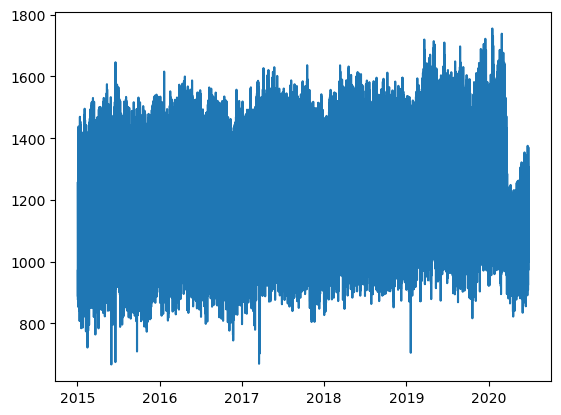

In [15]:
y=X.set_index('datetime')
plt.plot(y)

Here, we can see in year 2020 there is a drop in the demand so we are removing the pandemic dataset

**1.2 Removing pandemic dataset** 

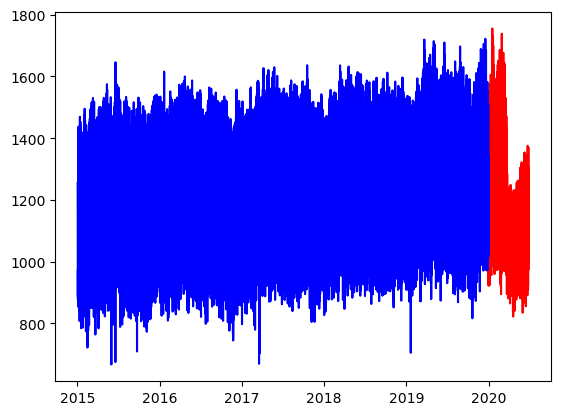

In [16]:
plt.plot(y[y.index.year==2020],color='red')
plt.plot(y[y.index.year!=2020],color='blue')
plt.show()

In [17]:
yearsm=[2015,2016,2017,2018,2019,2020]

In [18]:
ymean=[]
for i in yearsm:
    ymean.append(y[y.index.year==i].mean())
    print(str(i)+' --> '+str(y[y.index.year==i].mean()))

2015 --> net_demand    1131.6666
dtype: float64
2016 --> net_demand    1156.881473
dtype: float64
2017 --> net_demand    1182.477678
dtype: float64
2018 --> net_demand    1205.676767
dtype: float64
2019 --> net_demand    1244.098722
dtype: float64
2020 --> net_demand    1170.231495
dtype: float64


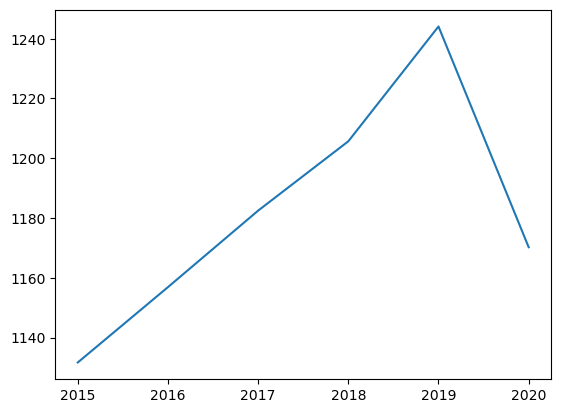

In [19]:
plt.plot(yearsm,ymean)

In [20]:
X.set_index('datetime',inplace=True)
print(len(X))
X=X[X.index.year!=2020]
print('After Removal : ')
print(len(X))

48048
After Removal : 
43775


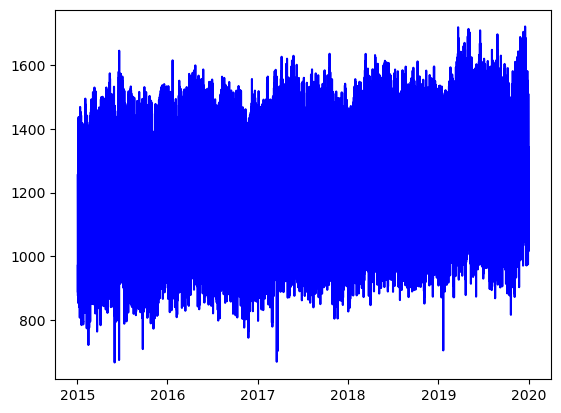

In [21]:
plt.plot(X[X.index.year==2020],color='red')
plt.plot(X[X.index.year!=2020],color='blue')
plt.show()

In [22]:
X.reset_index(inplace=True)

### 2.Filling Missing values

In [23]:
X.isna().sum()

datetime       0
net_demand    50
dtype: int64

In [24]:
X.isna().sum().sum()

50

In [25]:
X[X['net_demand'].isna()==True]

,datetime,net_demand
4,2015-01-03 05:00:00,NaN
698,2015-02-01 03:00:00,NaN
8999,2016-01-13 00:00:00,NaN
9000,2016-01-13 01:00:00,NaN
9001,2016-01-13 02:00:00,NaN
9002,2016-01-13 03:00:00,NaN
9003,2016-01-13 04:00:00,NaN
9004,2016-01-13 05:00:00,NaN
9005,2016-01-13 06:00:00,NaN
9006,2016-01-13 07:00:00,NaN


<AxesSubplot:>

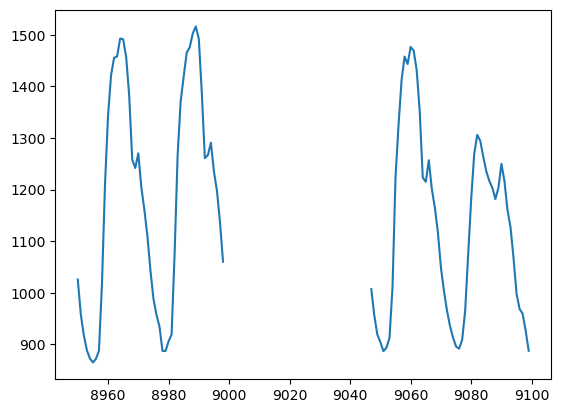

In [26]:
X[8950:9100]['net_demand'].plot()

In [27]:
X_miss_ff=X.copy()

In [28]:
X_miss_ff=X_miss_ff.ffill()

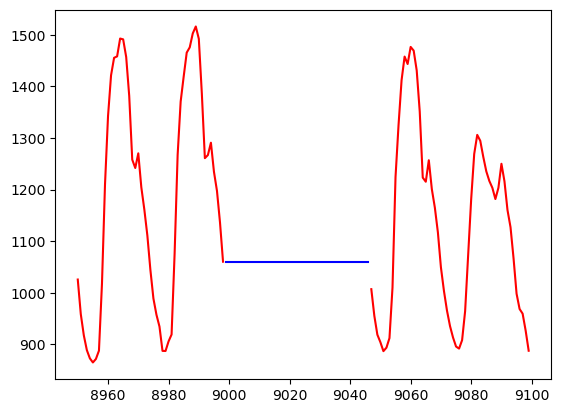

In [29]:
plt.plot(X_miss_ff[8999:9047]['net_demand'],color='blue')
plt.plot(X[8950:9100]['net_demand'],color='red')
plt.show()

In [30]:
X_miss_bf=X.copy()

In [31]:
X_miss_bf=X_miss_bf.bfill()

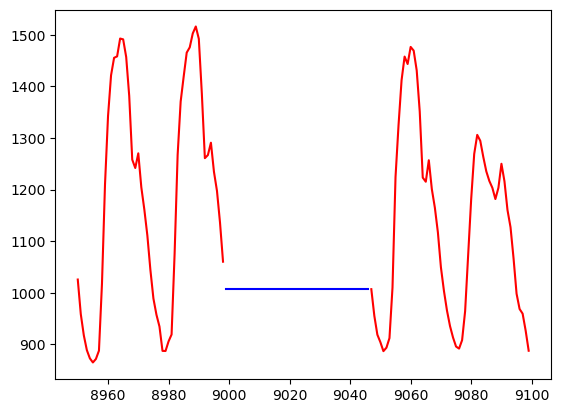

In [32]:
plt.plot(X_miss_bf[8999:9047]['net_demand'],color='blue')
plt.plot(X[8950:9100]['net_demand'],color='red')
plt.show()

In [33]:
X_miss_lin=X.copy()

In [34]:
X_miss_lin['net_demand']=X_miss_lin['net_demand'].interpolate()

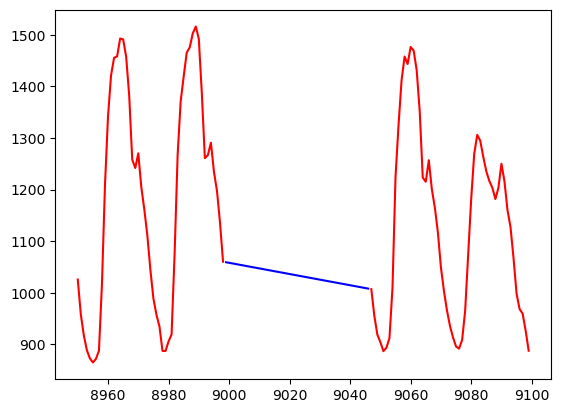

In [35]:
plt.plot(X_miss_lin[8999:9047]['net_demand'],color='blue')
plt.plot(X[8950:9100]['net_demand'],color='red')
plt.show()

In [36]:
X_miss_cubic=X.copy()

In [37]:
X_miss_cubic['net_demand']=X_miss_cubic['net_demand'].interpolate(method='polynomial',order=3)

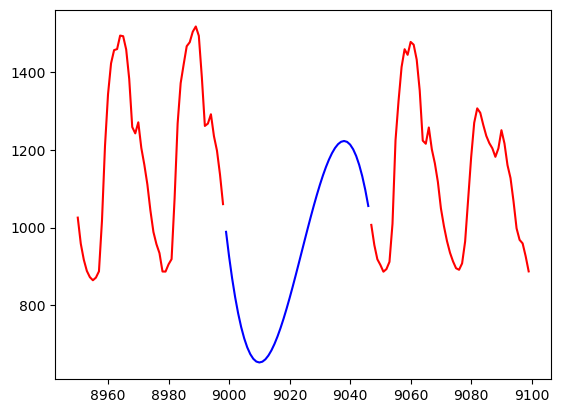

In [38]:
plt.plot(X_miss_cubic[8999:9047]['net_demand'],color='blue')
plt.plot(X[8950:9100]['net_demand'],color='red')
plt.show()

In [39]:
X_m_k=X.copy()

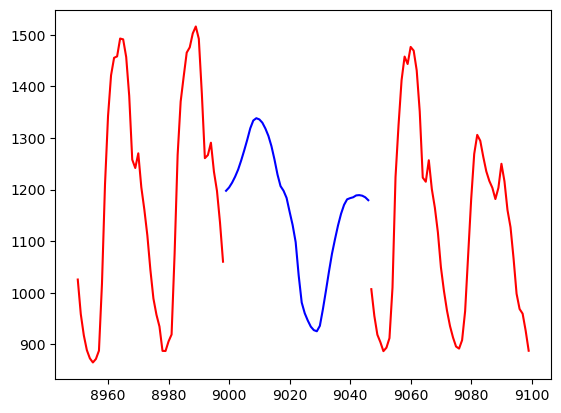

In [40]:
from sklearn.metrics import mean_squared_error
def knn_mean(ts, n):
 out = np.copy(ts)
 for i, val in enumerate(ts):
     if np.isnan(val):
         n_by_2 = np.ceil(n/2)
         lower = np.max([0, int(i-n_by_2)])
         upper = np.min([len(ts)+1, int(i+n_by_2)])
         ts_near = np.concatenate([ts[lower:i], ts[i:upper]])
         out[i] = np.nanmean(ts_near)
 return out
X_m_k['net_demand'] = knn_mean(X_m_k['net_demand'].values, 49)
plt.plot(X_m_k[8999:9047]['net_demand'],color='blue')
plt.plot(X[8950:9100]['net_demand'],color='red')
plt.show()

In [41]:
X_m_k.isna().sum()

datetime      0
net_demand    0
dtype: int64

In [42]:
X.isna().sum()

datetime       0
net_demand    50
dtype: int64

### Missing value inference

KNN mean shows its the best lag filling strategy than others.

In [43]:
X['net_demand']=X_m_k['net_demand']

In [44]:
X.isna().sum()

datetime      0
net_demand    0
dtype: int64

# 3.Descriptive Statistics

In [45]:
X.describe()

,net_demand
count,43775.000000
mean,1184.203368
std,193.090113
min,666.752800
25%,1017.606600
50%,1173.357800
75%,1332.121850
max,1721.515700


In [46]:
X.mean()

net_demand    1184.203368
dtype: float64

In [47]:
X["net_demand"].std()

193.0901132746015

In [48]:
x = X.groupby(X.datetime.dt.year).mean()
x

,net_demand
datetime,
2015,1131.643003
2016,1156.901467
2017,1182.477678
2018,1205.676767
2019,1244.098722


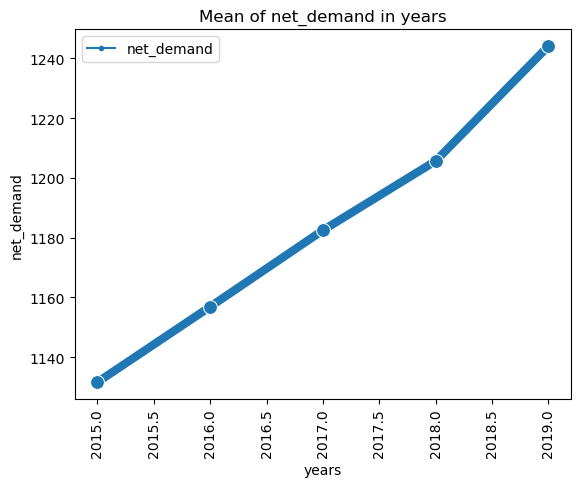

In [49]:
sns.lineplot(x,ms=20,markers='.',linewidth=6)
plt.xlabel("years")
plt.ylabel("net_demand")
plt.title("Mean of net_demand in years")
plt.xticks(rotation=90)
plt.show()

In [50]:
y = X.groupby(X.datetime.dt.year).std()
y

,net_demand
datetime,
2015,194.008497
2016,189.860849
2017,188.648385
2018,185.447926
2019,187.693374


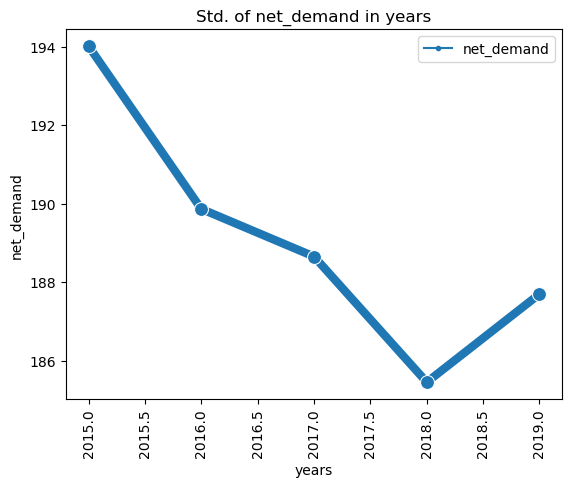

In [51]:
sns.lineplot(y,ms=20,markers='.',linewidth=6)
plt.xlabel("years")
plt.ylabel("net_demand")
plt.title("Std. of net_demand in years")
plt.xticks(rotation=90)
plt.show()

In [52]:
X.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 43775 entries, 0 to 43774
Data columns (total 2 columns):
 #   Column      Non-Null Count  Dtype         
---  ------      --------------  -----         
 0   datetime    43775 non-null  datetime64[ns]
 1   net_demand  43775 non-null  float64       
dtypes: datetime64[ns](1), float64(1)
memory usage: 684.1 KB


In [53]:
X[['datetime']]

,datetime
0,2015-01-03 01:00:00
1,2015-01-03 02:00:00
2,2015-01-03 03:00:00
3,2015-01-03 04:00:00
4,2015-01-03 05:00:00
...,...
43770,2019-12-31 19:00:00
43771,2019-12-31 20:00:00
43772,2019-12-31 21:00:00
43773,2019-12-31 22:00:00


# 4.Feature Engineering

## 4.1. Date time features

In [54]:
X_dt=X.copy()
X_dt.set_index('datetime', inplace=True)

In [55]:
X_dt['Year']=[d.year for d in X_dt.index]
X_dt['MonthNum']=[d.month for d in X_dt.index]
X_dt['Month']=[d.strftime('%b') for d in X_dt.index]
X_dt['Day']=[d.day for d in X_dt.index]
X_dt['DayName']=[d.strftime('%a') for d in X_dt.index]
X_dt['Hour']=[d.hour for d in X_dt.index]

In [56]:
X_dt

,net_demand,Year,MonthNum,Month,Day,DayName,Hour
datetime,,,,,,,
2015-01-03 01:00:00,970.345000,2015,1,Jan,3,Sat,1
2015-01-03 02:00:00,912.175500,2015,1,Jan,3,Sat,2
2015-01-03 03:00:00,900.268800,2015,1,Jan,3,Sat,3
2015-01-03 04:00:00,889.953800,2015,1,Jan,3,Sat,4
2015-01-03 05:00:00,1043.898189,2015,1,Jan,3,Sat,5
...,...,...,...,...,...,...,...
2019-12-31 19:00:00,1301.606500,2019,12,Dec,31,Tue,19
2019-12-31 20:00:00,1250.963400,2019,12,Dec,31,Tue,20
2019-12-31 21:00:00,1193.680200,2019,12,Dec,31,Tue,21


Text(0.5, 1.0, 'Net_demand of all Sundays at 9am')

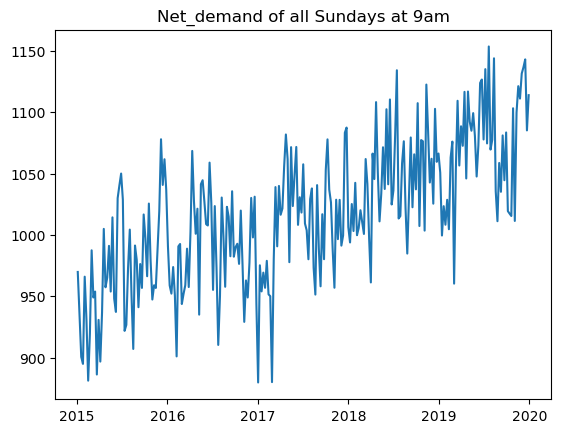

In [57]:
y=X_dt[X_dt.Hour==9]
plt.plot(y[y.DayName=='Sun']['net_demand'])
plt.title("Net_demand of all Sundays at 9am")

## 4.2. Lag Features

In [58]:
X_lag = X.copy()
X_lag.set_index('datetime', inplace = True)

In [59]:
#shifting the data
shifted = pd.concat([X_lag.shift(365*24),X_lag.shift(30*24),X_lag.shift(7*24),X_lag.shift(24),X_lag.shift(1),X_lag],axis=1)

In [60]:
shifted.columns=['Shift(One Year)','Shift(One Month)','Shift(One Week)','Shift(One Day)','Shift(One Hour)','Net_demand']
shifted

,Shift(One Year),Shift(One Month),Shift(One Week),Shift(One Day),Shift(One Hour),Net_demand
datetime,,,,,,
2015-01-03 01:00:00,NaN,NaN,NaN,NaN,NaN,970.345000
2015-01-03 02:00:00,NaN,NaN,NaN,NaN,970.3450,912.175500
2015-01-03 03:00:00,NaN,NaN,NaN,NaN,912.1755,900.268800
2015-01-03 04:00:00,NaN,NaN,NaN,NaN,900.2688,889.953800
2015-01-03 05:00:00,NaN,NaN,NaN,NaN,889.9538,1043.898189
...,...,...,...,...,...,...
2019-12-31 19:00:00,1278.6240,1341.5040,1369.7489,1384.1848,1287.3592,1301.606500
2019-12-31 20:00:00,1241.6289,1384.1905,1320.4199,1345.1400,1301.6065,1250.963400
2019-12-31 21:00:00,1193.0323,1369.4594,1249.6340,1309.8852,1250.9634,1193.680200


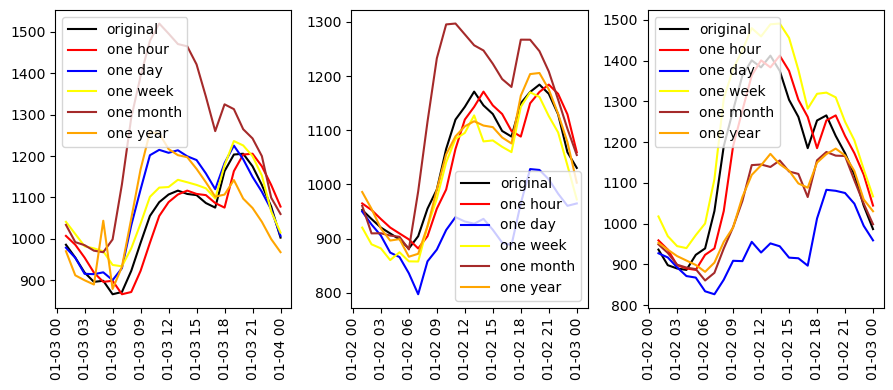

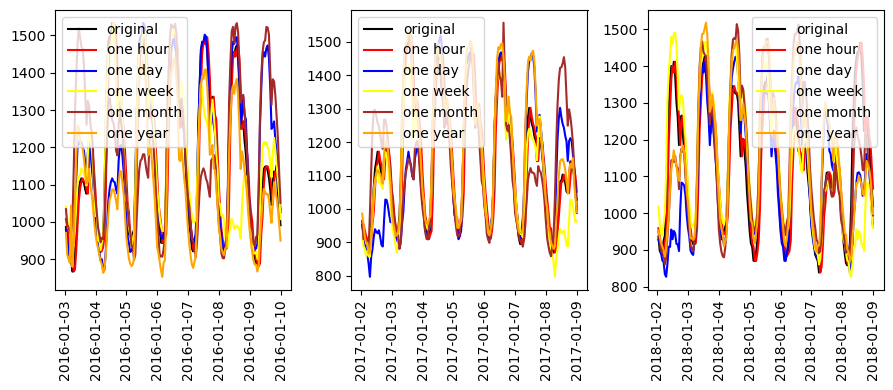

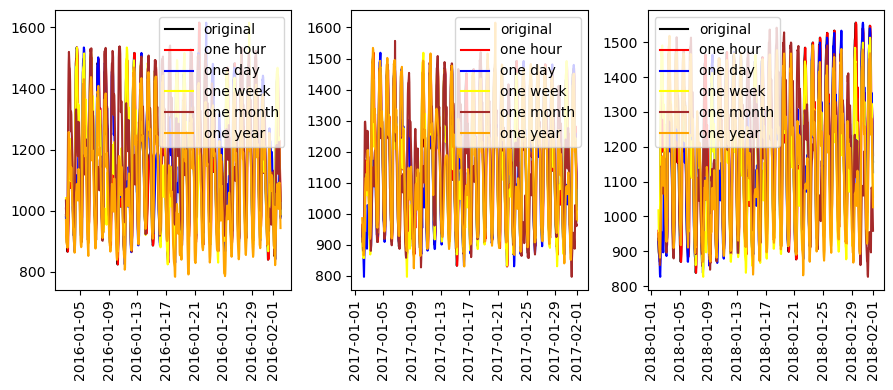

In [61]:
def see_it(start,add):
    plt.plot(shifted['Net_demand'][start:start+add],color='black',label='original')
    plt.plot(shifted['Shift(One Hour)'][start:start+add],color='red',label='one hour')
    plt.plot(shifted['Shift(One Day)'][start:start+add],color='blue',label='one day')
    plt.plot(shifted['Shift(One Week)'][start:start+add],color='yellow',label='one week')
    plt.plot(shifted['Shift(One Month)'][start:start+add],color='brown',label='one month')
    plt.plot(shifted['Shift(One Year)'][start:start+add],color='orange',label='one year')
    plt.legend()
    plt.xticks(rotation=90)
    
plt.figure(figsize=(12,4))
plt.subplot(1, 4, 1)
see_it(365*24,24)
plt.subplot(1, 4, 2)
see_it(365*24*2,24)
plt.subplot(1, 4, 3)
see_it(365*24*3,24)
plt.tight_layout()
plt.show()

plt.figure(figsize=(12,4))
plt.subplot(1, 4, 1)
see_it(365*24,24*7)
plt.subplot(1, 4, 2)
see_it(365*24*2,24*7)
plt.subplot(1, 4, 3)
see_it(365*24*3,24*7)
plt.tight_layout()
plt.show()

plt.figure(figsize=(12,4))
plt.subplot(1, 4, 1)
see_it(365*24,24*30)
plt.subplot(1, 4, 2)
see_it(365*24*2,24*30)
plt.subplot(1, 4, 3)
see_it(365*24*3,24*30)
plt.tight_layout()
plt.show()

In [62]:
use=X[:48]
use.set_index('datetime',inplace=True)

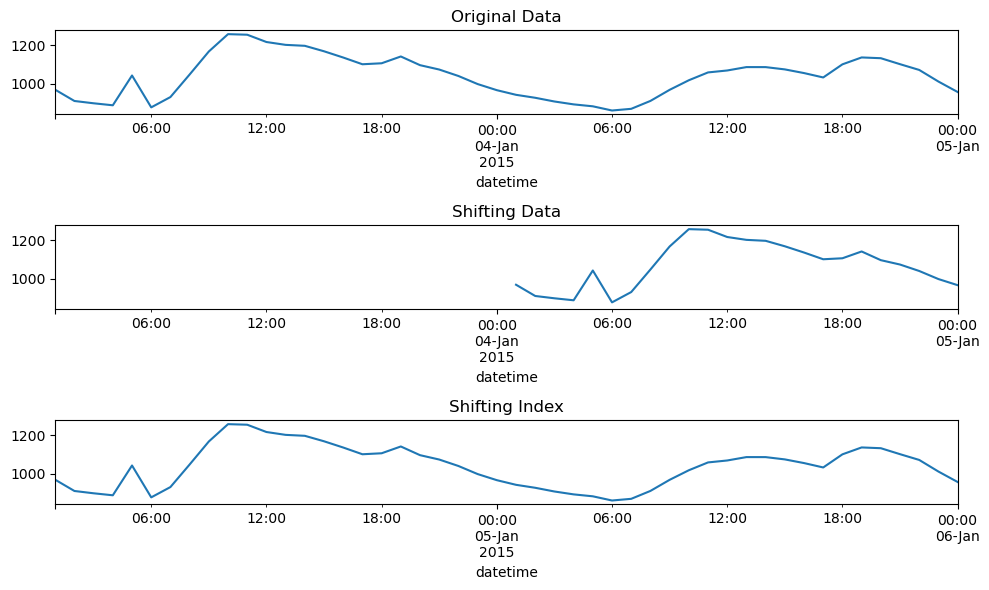

In [63]:
fig, ax = plt.subplots(nrows=3, figsize=(10,6), sharey=True)
fig.tight_layout(pad=2)
use.plot(ax=ax[0], title="Original Data", legend=None)
use.shift(24).plot(ax=ax[1], title="Shifting Data", legend=None)
use.tshift(24).plot(ax=ax[2], title="Shifting Index", legend=None)
plt.tight_layout()

In [64]:
X_lag["lag"+str(24)] = X_lag["net_demand"].shift(24)
X_lag["lag"+str(24*7)] = X_lag["net_demand"].shift(24*7)

In [65]:
for i in range(1,25):
    X_lag["lag"+str(i)] = X_lag["net_demand"].shift(i)
X_lag.head(28)

,net_demand,lag24,lag168,lag1,lag2,lag3,lag4,lag5,lag6,lag7,...,lag14,lag15,lag16,lag17,lag18,lag19,lag20,lag21,lag22,lag23
datetime,,,,,,,,,,,,,,,,,,,,,
2015-01-03 01:00:00,970.345000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2015-01-03 02:00:00,912.175500,NaN,NaN,970.345000,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2015-01-03 03:00:00,900.268800,NaN,NaN,912.175500,970.345000,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2015-01-03 04:00:00,889.953800,NaN,NaN,900.268800,912.175500,970.345000,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2015-01-03 05:00:00,1043.898189,NaN,NaN,889.953800,900.268800,912.175500,970.345000,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2015-01-03 06:00:00,879.232300,NaN,NaN,1043.898189,889.953800,900.268800,912.175500,970.345000,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2015-01-03 07:00:00,932.487600,NaN,NaN,879.232300,1043.898189,889.953800,900.268800,912.175500,970.345000,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2015-01-03 08:00:00,1048.972000,NaN,NaN,932.487600,879.232300,1043.898189,889.953800,900.268800,912.175500,970.345000,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2015-01-03 09:00:00,1167.907400,NaN,NaN,1048.972000,932.487600,879.232300,1043.898189,889.953800,900.268800,912.175500,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


A lag plot is used to checks whether the time series data is random or not, and if the data is correlated with themselves. **Random data should not have any identifiable patterns, such as linear.**

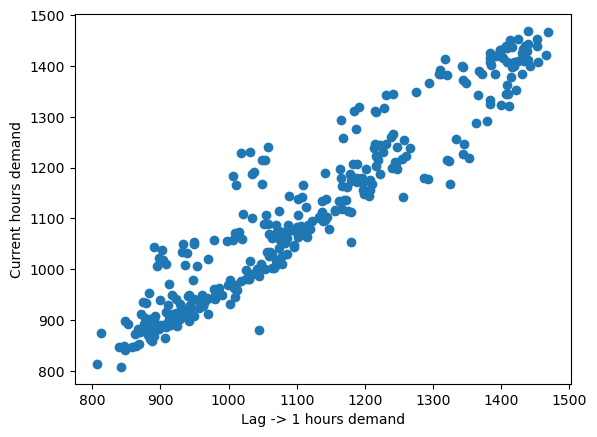

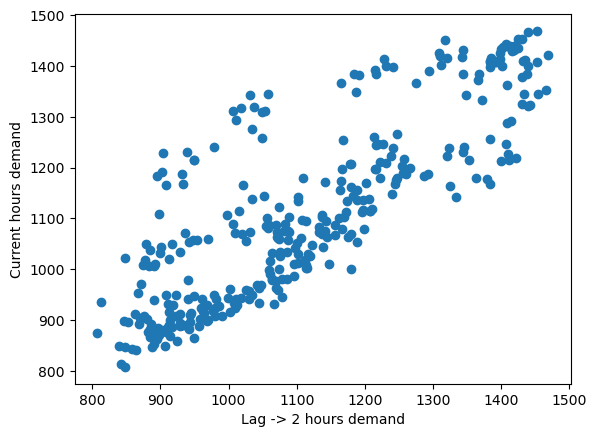

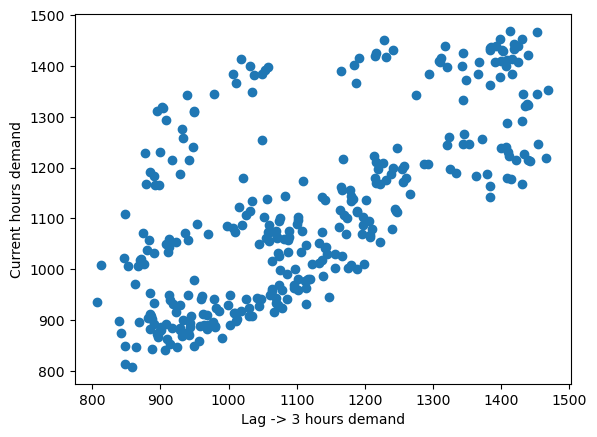

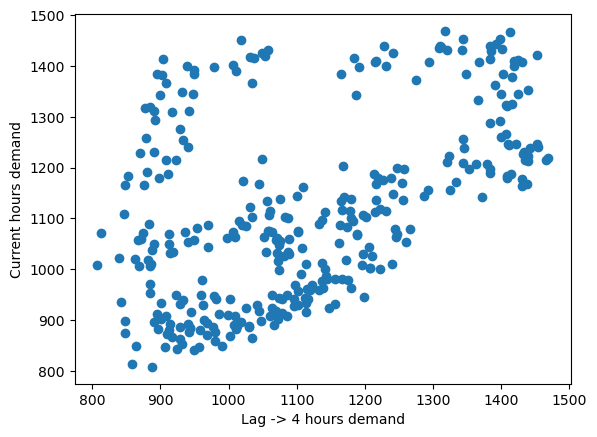

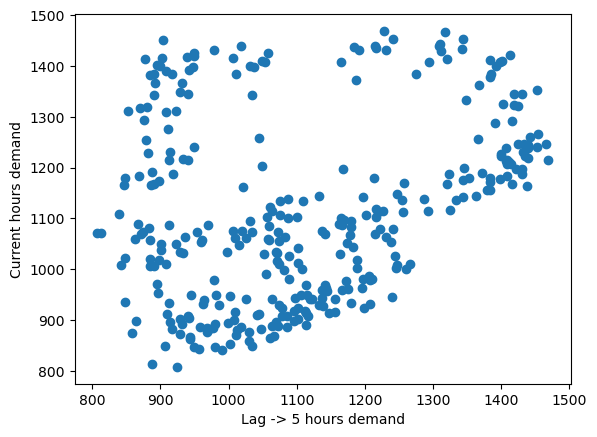

...

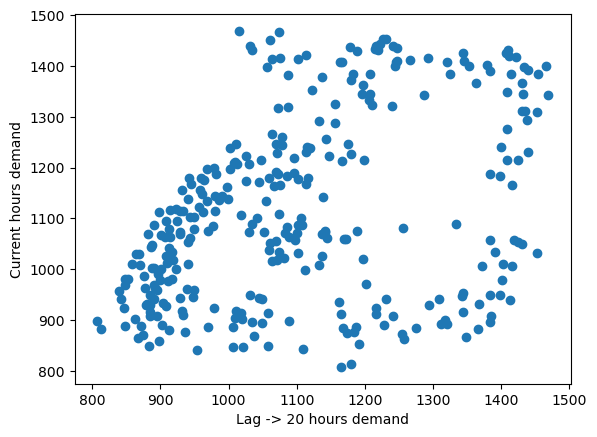

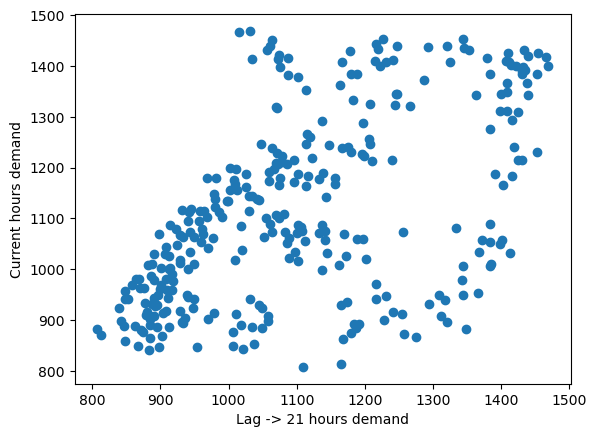

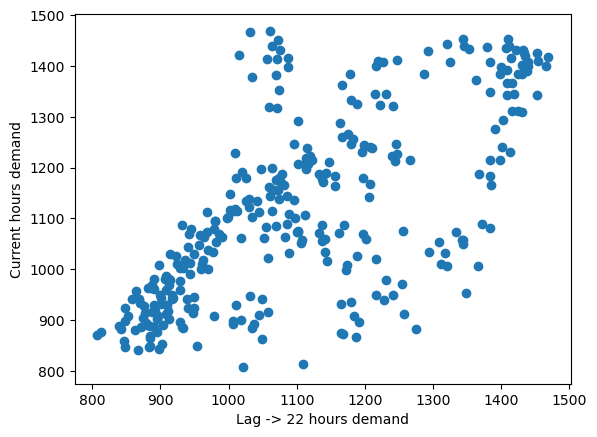

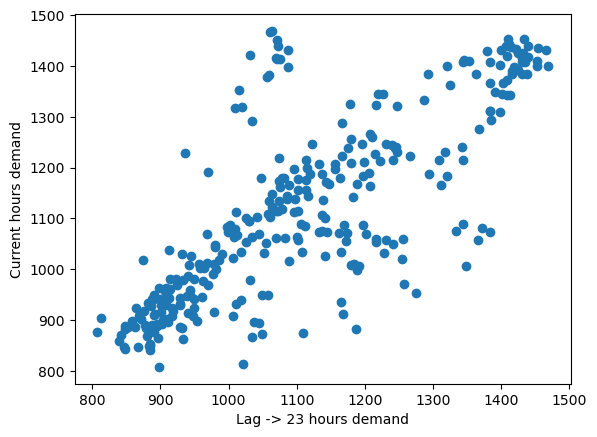

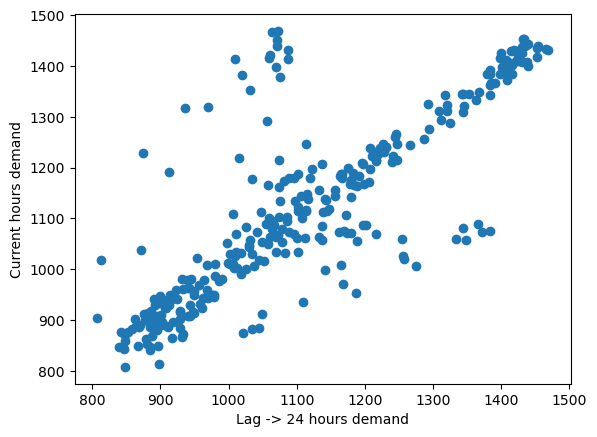

In [66]:
for i in range(1,25):
    plt.scatter(X_lag['lag'+str(i)][:24*14], X_lag['net_demand'][:24*14])
    plt.xlabel('Lag -> '+str(i)+" hours demand")
    plt.ylabel("Current hours demand")
    plt.show()

## 5. Rolling mean inference

In [67]:
X_rolling=X.copy()
X_rolling

,datetime,net_demand
0,2015-01-03 01:00:00,970.345000
1,2015-01-03 02:00:00,912.175500
2,2015-01-03 03:00:00,900.268800
3,2015-01-03 04:00:00,889.953800
4,2015-01-03 05:00:00,1043.898189
...,...,...
43770,2019-12-31 19:00:00,1301.606500
43771,2019-12-31 20:00:00,1250.963400
43772,2019-12-31 21:00:00,1193.680200
43773,2019-12-31 22:00:00,1130.457500


Text(0, 0.5, 'net_demand')

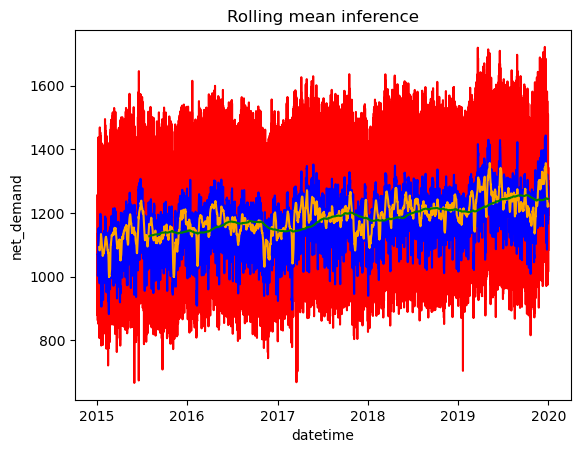

In [68]:
X_rolling.set_index('datetime',inplace=True)
plt.plot(X_rolling,color='red')
plt.plot(X_rolling.rolling(24).mean(),color='blue')
plt.plot(X_rolling.rolling(24*7).mean(),color='orange')
plt.plot(X_rolling.rolling(24*7*30).mean(),color='green')
plt.plot(X_rolling.rolling(24*7*30*12).mean(),color='black')
plt.title("Rolling mean inference")
plt.xlabel("datetime")
plt.ylabel("net_demand")

Text(0.5, 1.0, 'Month data rolling mean')

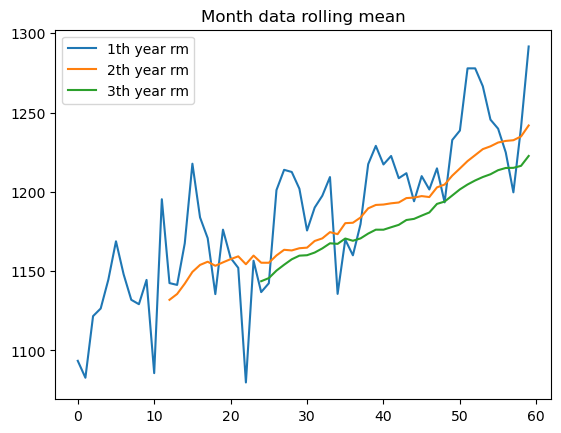

In [69]:
rand_color=['tab:blue','tab:brown','tab:orange','tab:green','tab:red','tab:purple','tab:pink','tab:grey','tab:olive','tab:cyan','teal','yellow']
X_rolling_month=X_rolling.resample('M').mean()
X_rolling_month.reset_index(inplace=True)
for i in range(1,36,12):
    plt.plot(X_rolling_month.rolling(i).mean(),label=str((i//12)+1)+'th year rm')
plt.legend()
plt.title("Month data rolling mean")

In [70]:
X_rolling_month.set_index('datetime',inplace=True)

In [71]:
for i in range(2,12):
    X_rolling_month[str(i)+"th rolling"]=X_rolling_month.rolling(i).mean()['net_demand']

In [72]:
X_rolling_month

,net_demand,2th rolling,3th rolling,4th rolling,5th rolling,6th rolling,7th rolling,8th rolling,9th rolling,10th rolling,11th rolling
datetime,,,,,,,,,,,
2015-01-31,1093.412712,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2015-02-28,1082.740425,1088.076568,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2015-03-31,1121.586887,1102.163656,1099.246674,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2015-04-30,1126.410568,1123.998728,1110.245960,1106.037648,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2015-05-31,1144.580820,1135.495694,1130.859425,1118.829675,1113.746282,NaN,NaN,NaN,NaN,NaN,NaN
2015-06-30,1168.796143,1156.688481,1146.595844,1140.343604,1128.822969,1122.921259,NaN,NaN,NaN,NaN,NaN
2015-07-31,1147.976062,1158.386102,1153.784342,1146.940898,1141.870096,1132.015151,1126.500517,NaN,NaN,NaN,NaN
2015-08-31,1131.896944,1139.936503,1149.556383,1148.312492,1143.932107,1140.207904,1131.998264,1127.175070,NaN,NaN,NaN
2015-09-30,1129.116481,1130.506712,1136.329829,1144.446407,1144.473290,1141.462836,1138.623415,1131.638041,1127.390782,NaN,NaN


Text(0.5, 1.0, 'Week data rolling mean')

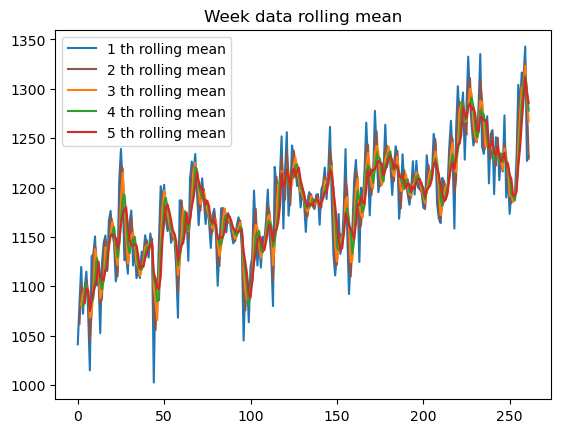

In [73]:
X_rolling_week=X_rolling.resample('W').mean()
X_rolling_week.reset_index(inplace=True)
for i in range(1,6):
    plt.plot(X_rolling_week.rolling(window=i).mean(),color=rand_color[i-1],label=str(i)+' th rolling mean')
plt.legend()
plt.title("Week data rolling mean")

In [74]:
X_rolling_week.set_index('datetime',inplace=True)

In [75]:
for i in range(2,12):
    X_rolling_week[str(i)+"th rolling"]=X_rolling_week.rolling(i).mean()['net_demand']

In [76]:
X_rolling_week

,net_demand,2th rolling,3th rolling,4th rolling,5th rolling,6th rolling,7th rolling,8th rolling,9th rolling,10th rolling,11th rolling
datetime,,,,,,,,,,,
2015-01-04,1041.240627,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2015-01-11,1082.854895,1062.047761,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2015-01-18,1119.537590,1101.196243,1081.211038,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2015-01-25,1072.153179,1095.845385,1091.515222,1078.946573,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2015-02-01,1098.424455,1085.288817,1096.705075,1093.242530,1082.842149,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...
2019-12-08,1316.441260,1299.683405,1301.131118,1283.658189,1265.128225,1252.158300,1244.043336,1235.200815,1232.598723,1228.337519,1232.405668
2019-12-15,1310.131818,1313.286539,1303.166210,1303.381293,1288.952915,1272.628824,1260.440231,1252.304396,1243.526482,1240.352032,1235.773364
2019-12-22,1342.811593,1326.471705,1323.128224,1313.077555,1311.267353,1297.929361,1282.654934,1270.736652,1262.360751,1253.454993,1249.666538


Text(0.5, 1.0, 'Daily data rolling mean')

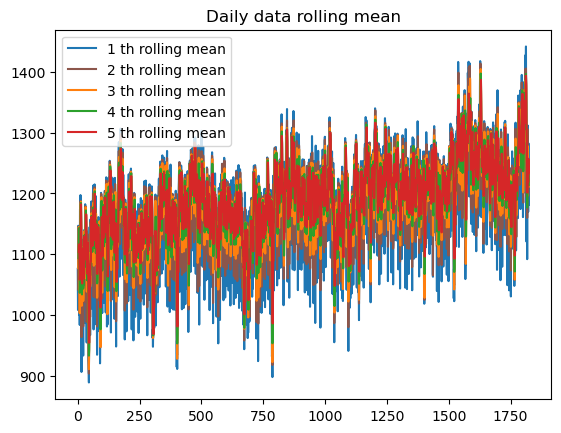

In [77]:
X_rolling_day=X_rolling.resample('D').mean()
X_rolling_day.reset_index(inplace=True)
for i in range(1,6):
    plt.plot(X_rolling_day.rolling(window=i).mean(),color=rand_color[i-1],label=str(i)+' th rolling mean')
plt.legend()
plt.title("Daily data rolling mean")

# 6. Visualization of our Datasets

### 6.1. Time Series plot of Electricity Demand

In [78]:
dfe=X[['datetime','net_demand']]
dfe.set_index('datetime',inplace=True)
dfe.head()

,net_demand
datetime,
2015-01-03 01:00:00,970.345000
2015-01-03 02:00:00,912.175500
2015-01-03 03:00:00,900.268800
2015-01-03 04:00:00,889.953800
2015-01-03 05:00:00,1043.898189


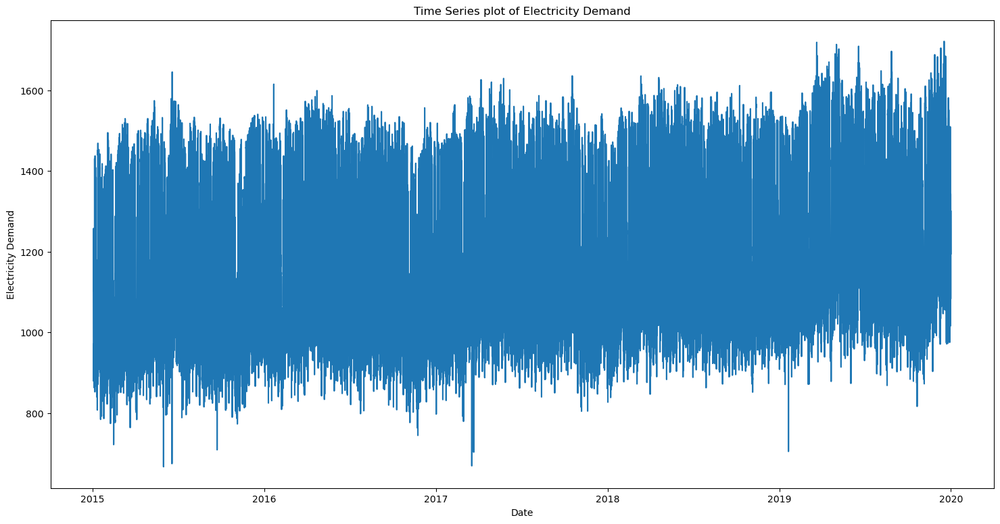

In [79]:
plt.figure(figsize=(18,9))
plt.plot(dfe)
plt.xlabel('Date')
plt.ylabel('Electricity Demand')
plt.title('Time Series plot of Electricity Demand')
plt.show()

In [80]:
X_day=dfe.resample('D').mean()
X_week=dfe.resample('w').mean()
X_month=dfe.resample('M').mean()
X_year=dfe.resample('Y').mean()
X_quarter=dfe.resample('Q').mean()

In [81]:
print(len(X_day))
print(len(X_week))
print(len(X_month))
print(len(X_quarter))
print(len(X_year))

1824
262
60
20
5


In [82]:
X_day.head()

,net_demand
datetime,
2015-01-03,1075.797530
2015-01-04,1008.123596
2015-01-05,1146.682925
2015-01-06,1143.394429
2015-01-07,1144.098817


### 6.2 Days in a month Vs electricity demand
yearwise -> monthwise vs day

In [83]:
X_day['Year']=[d.year for d in X_day.index]
X_day['MonthNum']=[d.month for d in X_day.index]
X_day['Month']=[d.strftime('%b') for d in X_day.index]
X_day['Day']=[d.day for d in X_day.index]

In [84]:
X_day.head()

,net_demand,Year,MonthNum,Month,Day
datetime,,,,,
2015-01-03,1075.797530,2015,1,Jan,3
2015-01-04,1008.123596,2015,1,Jan,4
2015-01-05,1146.682925,2015,1,Jan,5
2015-01-06,1143.394429,2015,1,Jan,6
2015-01-07,1144.098817,2015,1,Jan,7


In [85]:
years=X_day['Year'].unique()
months=X_day['Month'].unique()
month_num=X_day['MonthNum'].unique()
days=X_day['Day'].unique()

In [86]:
month_num

array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12], dtype=int64)

In [87]:
months

array(['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep',
       'Oct', 'Nov', 'Dec'], dtype=object)

In [88]:
X_day.loc[X_day.Year==2018]

,net_demand,Year,MonthNum,Month,Day
datetime,,,,,
2018-01-01,940.818662,2018,1,Jan,1
2018-01-02,1153.721333,2018,1,Jan,2
2018-01-03,1181.678700,2018,1,Jan,3
2018-01-04,1146.691433,2018,1,Jan,4
2018-01-05,1129.912683,2018,1,Jan,5
...,...,...,...,...,...
2018-12-27,1252.963496,2018,12,Dec,27
2018-12-28,1265.321875,2018,12,Dec,28
2018-12-29,1176.583363,2018,12,Dec,29


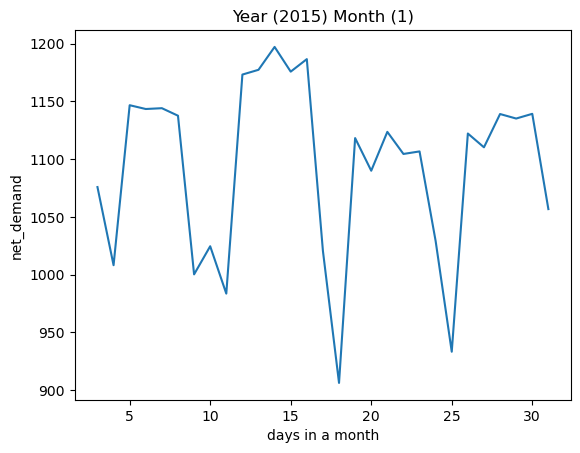

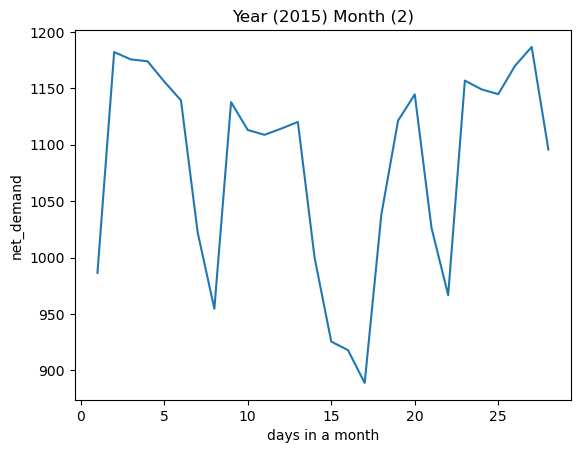

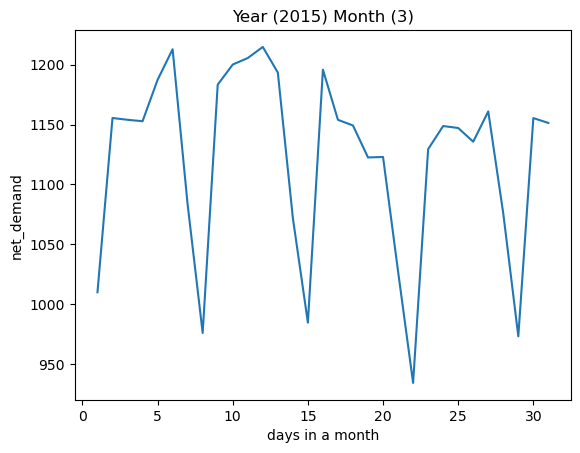

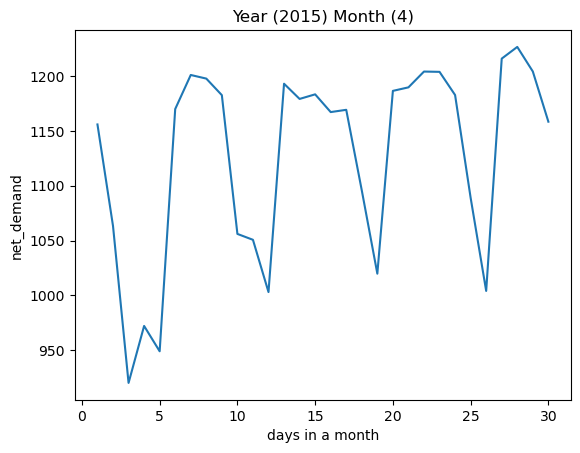

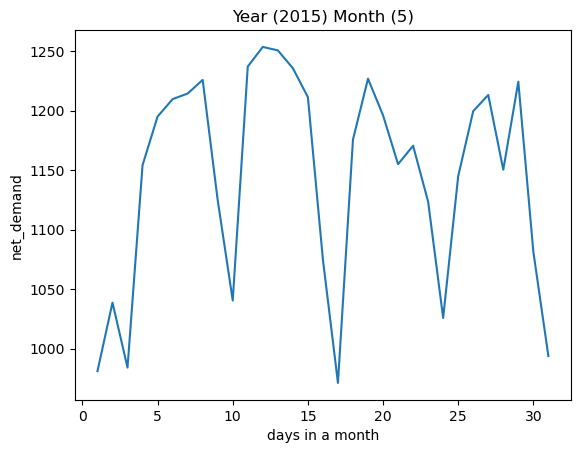

...

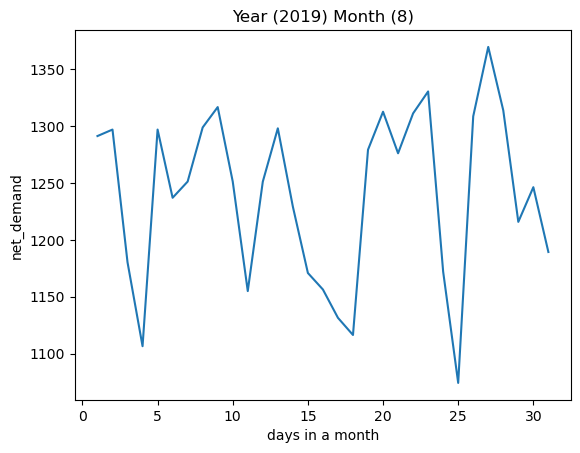

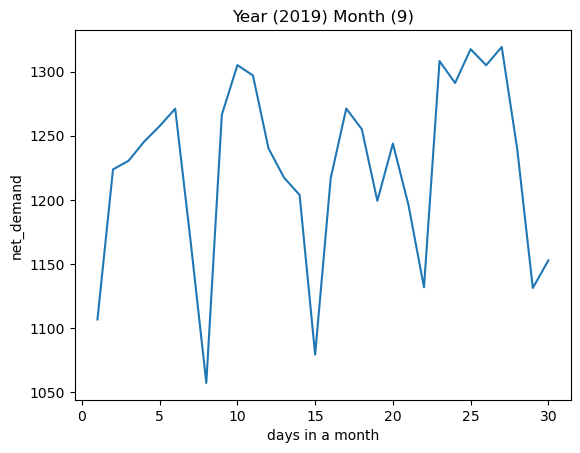

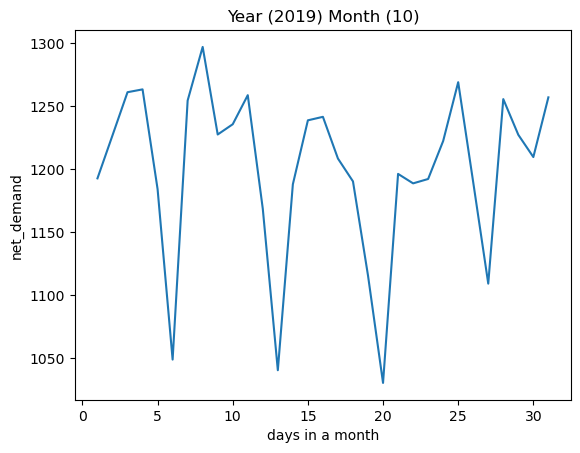

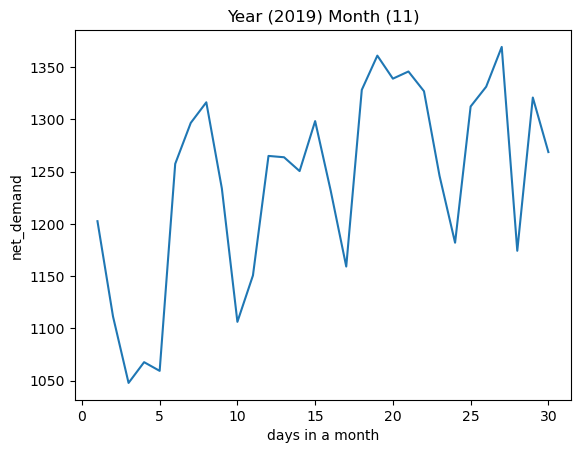

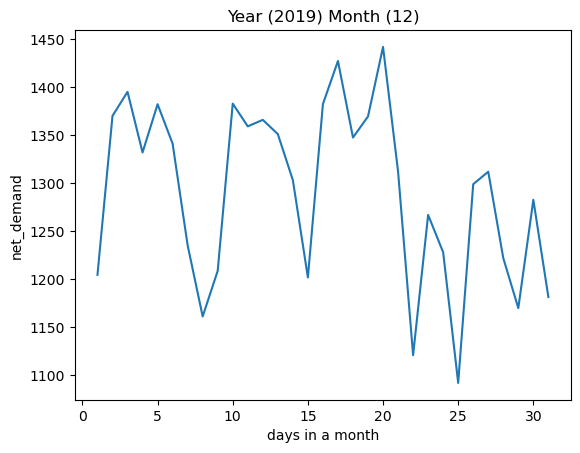

In [89]:
i=0
for year in years:
    year_daily = X_day.loc[X_day.Year==year]
    for month in month_num:
        i+=1
        ts=year_daily.loc[year_daily.MonthNum==month]
        plt.title('Year ('+str(year)+')'+ ' Month ('+str(month)+')')
        plt.plot('Day','net_demand',data=ts)
        plt.xlabel("days in a month")
        plt.ylabel("net_demand")
        plt.show()

,net_demand,Year,MonthNum,Month,Day
datetime,,,,,
2015-01-03,1075.797530,2015,1,Jan,3
2015-01-04,1008.123596,2015,1,Jan,4
2015-01-05,1146.682925,2015,1,Jan,5
2015-01-06,1143.394429,2015,1,Jan,6
2015-01-07,1144.098817,2015,1,Jan,7
...,...,...,...,...,...
2015-12-27,1082.249396,2015,12,Dec,27
2015-12-28,1236.531162,2015,12,Dec,28
2015-12-29,1246.377787,2015,12,Dec,29


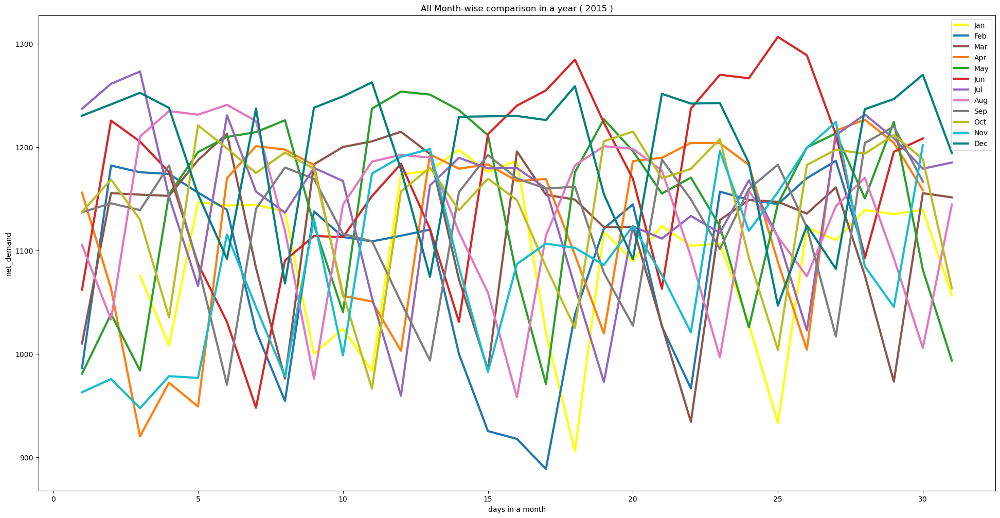

,net_demand,Year,MonthNum,Month,Day
datetime,,,,,
2016-01-01,1013.740825,2016,1,Jan,1
2016-01-02,1087.987517,2016,1,Jan,2
2016-01-03,1042.299054,2016,1,Jan,3
2016-01-04,1235.447338,2016,1,Jan,4
2016-01-05,1237.458858,2016,1,Jan,5
...,...,...,...,...,...
2016-12-27,1173.583333,2016,12,Dec,27
2016-12-28,1214.166925,2016,12,Dec,28
2016-12-29,1215.649583,2016,12,Dec,29


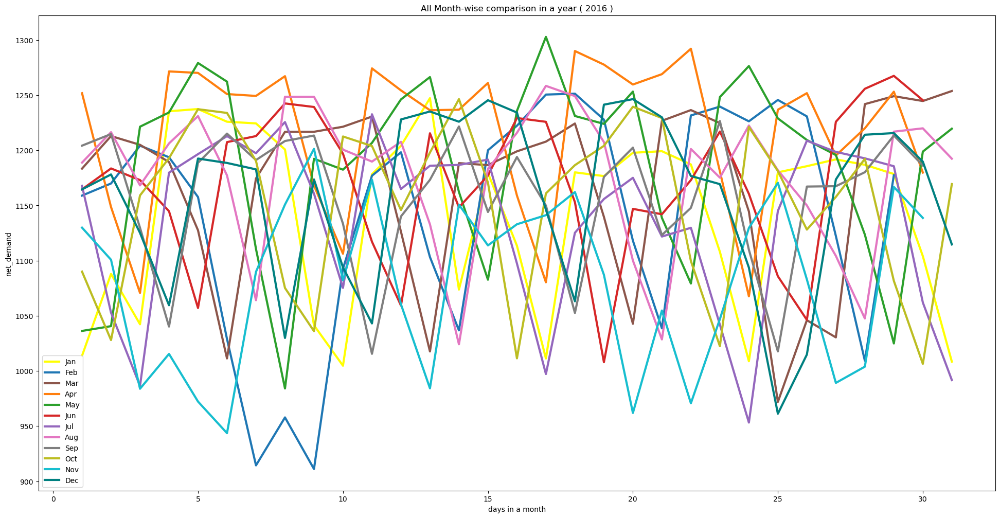

,net_demand,Year,MonthNum,Month,Day
datetime,,,,,
2017-01-01,924.046471,2017,1,Jan,1
2017-01-02,1047.362042,2017,1,Jan,2
2017-01-03,1228.897275,2017,1,Jan,3
2017-01-04,1205.827796,2017,1,Jan,4
2017-01-05,1212.550917,2017,1,Jan,5
...,...,...,...,...,...
2017-12-27,1230.238671,2017,12,Dec,27
2017-12-28,1230.086312,2017,12,Dec,28
2017-12-29,1206.092108,2017,12,Dec,29


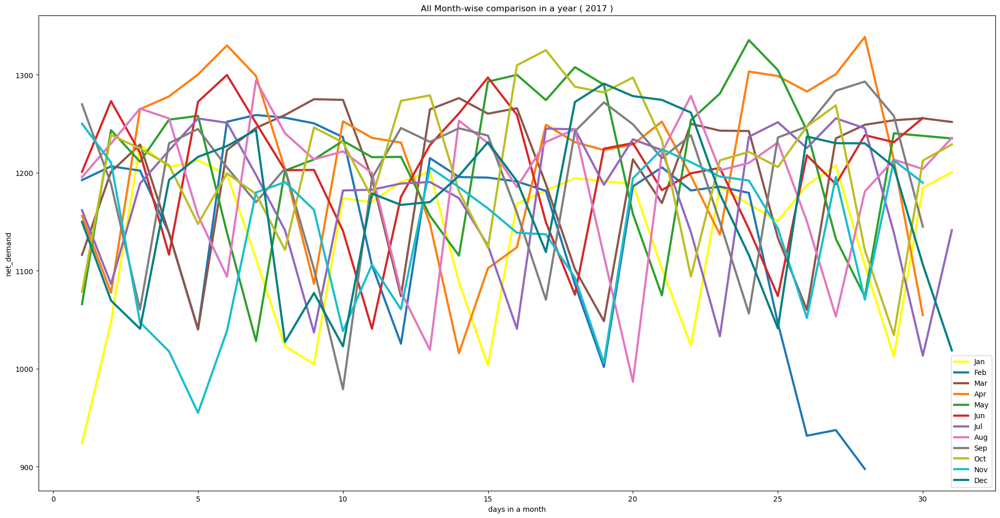

,net_demand,Year,MonthNum,Month,Day
datetime,,,,,
2018-01-01,940.818662,2018,1,Jan,1
2018-01-02,1153.721333,2018,1,Jan,2
2018-01-03,1181.678700,2018,1,Jan,3
2018-01-04,1146.691433,2018,1,Jan,4
2018-01-05,1129.912683,2018,1,Jan,5
...,...,...,...,...,...
2018-12-27,1252.963496,2018,12,Dec,27
2018-12-28,1265.321875,2018,12,Dec,28
2018-12-29,1176.583363,2018,12,Dec,29


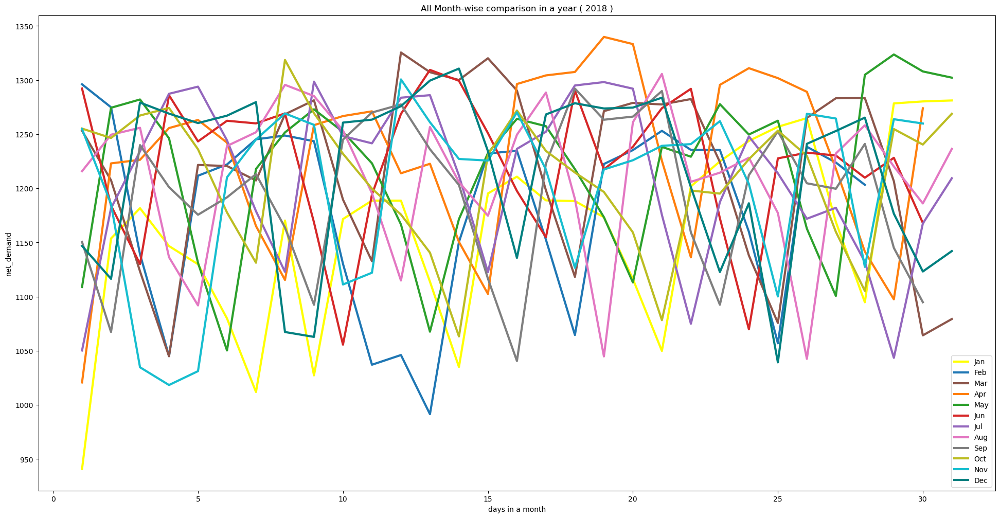

,net_demand,Year,MonthNum,Month,Day
datetime,,,,,
2019-01-01,1021.393883,2019,1,Jan,1
2019-01-02,1234.260929,2019,1,Jan,2
2019-01-03,1253.296350,2019,1,Jan,3
2019-01-04,1255.315867,2019,1,Jan,4
2019-01-05,1178.375279,2019,1,Jan,5
...,...,...,...,...,...
2019-12-27,1311.685079,2019,12,Dec,27
2019-12-28,1221.666396,2019,12,Dec,28
2019-12-29,1169.654546,2019,12,Dec,29


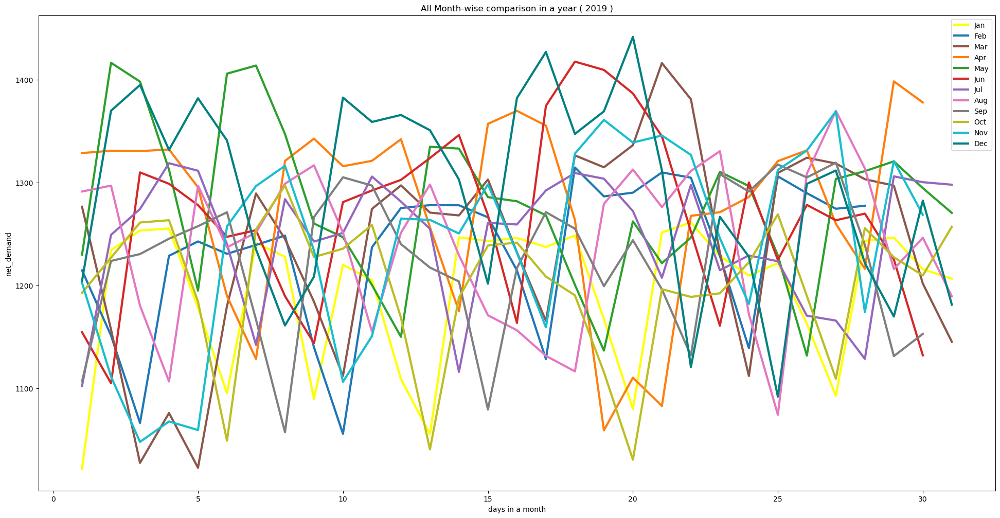

In [90]:
i=0
for year in years:
    year_daily = X_day.loc[X_day.Year==year]
    year_daily=pd.DataFrame(year_daily)
    display(year_daily)
    plt.figure(figsize=(24,12))
    for i in range(len(month_num)):
        plt.plot('Day','net_demand',data=year_daily.loc[year_daily.MonthNum==month_num[i]], color= rand_color[i-1], label=months[i],linewidth=3)
        plt.xlabel("days in a month")
        plt.ylabel("net_demand")
        plt.title("All Month-wise comparison in a year ( "+str(year)+' )')
        plt.legend()
    plt.show()
    

### 2.3. Comparison between years month-wise

In [91]:
X_month['Year']=[d.year for d in X_month.index]
X_month['MonthNum']=[d.month for d in X_month.index]
X_month['Month']=[d.strftime('%b') for d in X_month.index]

In [92]:
X_month.head()

,net_demand,Year,MonthNum,Month
datetime,,,,
2015-01-31,1093.412712,2015,1,Jan
2015-02-28,1082.740425,2015,2,Feb
2015-03-31,1121.586887,2015,3,Mar
2015-04-30,1126.410568,2015,4,Apr
2015-05-31,1144.580820,2015,5,May


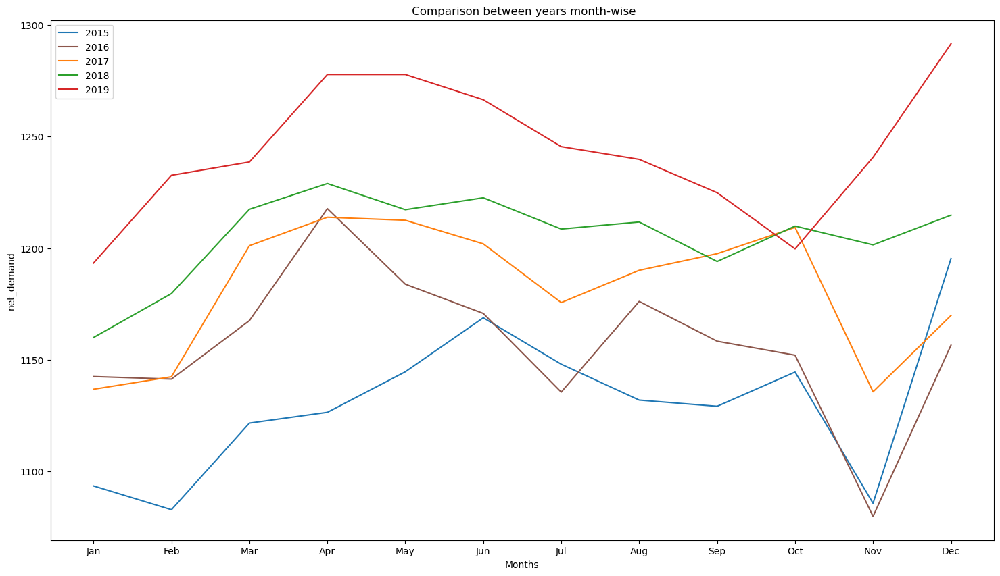

In [93]:
plt.figure(figsize=(18,10))
for i in range(len(years)):
    plt.plot('Month','net_demand',data=X_month.loc[X_month.Year==years[i],:],color=rand_color[i],label=years[i])
    plt.xlabel("Months")
    plt.ylabel("net_demand")
    plt.title(" Comparison between years month-wise")
plt.legend()

### 2.4.Quarterwise vs Year

In [94]:
X_quarter['Year']=[d.year for d in X_quarter.index]
X_quarter['MonthNum']=[d.month for d in X_quarter.index]
X_quarter['Month']=[d.strftime('%b') for d in X_quarter.index]

In [95]:
X_quarter.head()

,net_demand,Year,MonthNum,Month
datetime,,,,
2015-03-31,1099.945071,2015,3,Mar
2015-06-30,1146.573701,2015,6,Jun
2015-09-30,1136.408235,2015,9,Sep
2015-12-31,1142.414770,2015,12,Dec
2016-03-31,1150.617003,2016,3,Mar


In [96]:
month_q=[3,6,9,12]

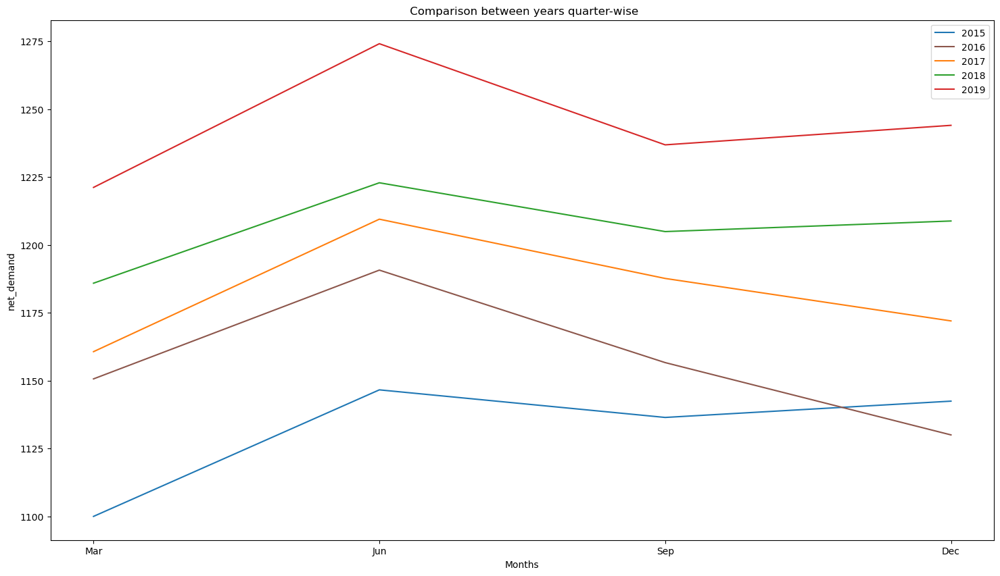

In [97]:
plt.figure(figsize=(18,10))
for i in range(len(years)):
    plt.plot('Month','net_demand',data=X_quarter.loc[X_quarter.Year==years[i],:],color=rand_color[i],label=years[i])
    plt.xlabel("Months")
    plt.ylabel("net_demand")
    plt.title(" Comparison between years quarter-wise")
plt.legend()

###  2.5. Weekwise

In [98]:
X_day['DayName']=[d.strftime('%a') for d in X_day.index]

In [99]:
X_day

,net_demand,Year,MonthNum,Month,Day,DayName
datetime,,,,,,
2015-01-03,1075.797530,2015,1,Jan,3,Sat
2015-01-04,1008.123596,2015,1,Jan,4,Sun
2015-01-05,1146.682925,2015,1,Jan,5,Mon
2015-01-06,1143.394429,2015,1,Jan,6,Tue
2015-01-07,1144.098817,2015,1,Jan,7,Wed
...,...,...,...,...,...,...
2019-12-27,1311.685079,2019,12,Dec,27,Fri
2019-12-28,1221.666396,2019,12,Dec,28,Sat
2019-12-29,1169.654546,2019,12,Dec,29,Sun


In [100]:
day_name=X_day['DayName'].unique()
day_name

array(['Sat', 'Sun', 'Mon', 'Tue', 'Wed', 'Thu', 'Fri'], dtype=object)

In [101]:
X_day[X_day.Year==2015]

,net_demand,Year,MonthNum,Month,Day,DayName
datetime,,,,,,
2015-01-03,1075.797530,2015,1,Jan,3,Sat
2015-01-04,1008.123596,2015,1,Jan,4,Sun
2015-01-05,1146.682925,2015,1,Jan,5,Mon
2015-01-06,1143.394429,2015,1,Jan,6,Tue
2015-01-07,1144.098817,2015,1,Jan,7,Wed
...,...,...,...,...,...,...
2015-12-27,1082.249396,2015,12,Dec,27,Sun
2015-12-28,1236.531162,2015,12,Dec,28,Mon
2015-12-29,1246.377787,2015,12,Dec,29,Tue


In [102]:
s=X_day[X_day.Year==2015]

In [103]:
s1=s[s.MonthNum==1]

In [104]:
s1

,net_demand,Year,MonthNum,Month,Day,DayName
datetime,,,,,,
2015-01-03,1075.797530,2015,1,Jan,3,Sat
2015-01-04,1008.123596,2015,1,Jan,4,Sun
2015-01-05,1146.682925,2015,1,Jan,5,Mon
2015-01-06,1143.394429,2015,1,Jan,6,Tue
2015-01-07,1144.098817,2015,1,Jan,7,Wed
2015-01-08,1137.586800,2015,1,Jan,8,Thu
2015-01-09,1000.170962,2015,1,Jan,9,Fri
2015-01-10,1024.540550,2015,1,Jan,10,Sat
2015-01-11,983.509783,2015,1,Jan,11,Sun


In [105]:
gk = s1.groupby('DayName')

In [106]:
gk.get_group('Fri')

,net_demand,Year,MonthNum,Month,Day,DayName
datetime,,,,,,
2015-01-09,1000.170962,2015,1,Jan,9,Fri
2015-01-16,1186.593337,2015,1,Jan,16,Fri
2015-01-23,1106.667033,2015,1,Jan,23,Fri
2015-01-30,1139.216225,2015,1,Jan,30,Fri


In [107]:
month_num

array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12], dtype=int64)

In [108]:
demand=[]
Year=[]
Month=[]
DayName=[]
for i in range(len(years)):
#     print('Year - '+str(years[i]))
    X_day_year=X_day[X_day.Year==years[i]]
    display(X_day_year)
    for j in range(len(month_num)):
        X_day_year_month=X_day_year[X_day_year.MonthNum==month_num[j]]
        gk = X_day_year_month.groupby('DayName')
#         print('Month - '+str(month_num[j]))
        for k in day_name:
            s=gk.get_group(k)['net_demand'].mean()
#             print(s)
            demand.append(s)
            Year.append(years[i])
            Month.append(month_num[j])
            DayName.append(k)

,net_demand,Year,MonthNum,Month,Day,DayName
datetime,,,,,,
2015-01-03,1075.797530,2015,1,Jan,3,Sat
2015-01-04,1008.123596,2015,1,Jan,4,Sun
2015-01-05,1146.682925,2015,1,Jan,5,Mon
2015-01-06,1143.394429,2015,1,Jan,6,Tue
2015-01-07,1144.098817,2015,1,Jan,7,Wed
...,...,...,...,...,...,...
2015-12-27,1082.249396,2015,12,Dec,27,Sun
2015-12-28,1236.531162,2015,12,Dec,28,Mon
2015-12-29,1246.377787,2015,12,Dec,29,Tue


,net_demand,Year,MonthNum,Month,Day,DayName
datetime,,,,,,
2016-01-01,1013.740825,2016,1,Jan,1,Fri
2016-01-02,1087.987517,2016,1,Jan,2,Sat
2016-01-03,1042.299054,2016,1,Jan,3,Sun
2016-01-04,1235.447338,2016,1,Jan,4,Mon
2016-01-05,1237.458858,2016,1,Jan,5,Tue
...,...,...,...,...,...,...
2016-12-27,1173.583333,2016,12,Dec,27,Tue
2016-12-28,1214.166925,2016,12,Dec,28,Wed
2016-12-29,1215.649583,2016,12,Dec,29,Thu


,net_demand,Year,MonthNum,Month,Day,DayName
datetime,,,,,,
2017-01-01,924.046471,2017,1,Jan,1,Sun
2017-01-02,1047.362042,2017,1,Jan,2,Mon
2017-01-03,1228.897275,2017,1,Jan,3,Tue
2017-01-04,1205.827796,2017,1,Jan,4,Wed
2017-01-05,1212.550917,2017,1,Jan,5,Thu
...,...,...,...,...,...,...
2017-12-27,1230.238671,2017,12,Dec,27,Wed
2017-12-28,1230.086312,2017,12,Dec,28,Thu
2017-12-29,1206.092108,2017,12,Dec,29,Fri


,net_demand,Year,MonthNum,Month,Day,DayName
datetime,,,,,,
2018-01-01,940.818662,2018,1,Jan,1,Mon
2018-01-02,1153.721333,2018,1,Jan,2,Tue
2018-01-03,1181.678700,2018,1,Jan,3,Wed
2018-01-04,1146.691433,2018,1,Jan,4,Thu
2018-01-05,1129.912683,2018,1,Jan,5,Fri
...,...,...,...,...,...,...
2018-12-27,1252.963496,2018,12,Dec,27,Thu
2018-12-28,1265.321875,2018,12,Dec,28,Fri
2018-12-29,1176.583363,2018,12,Dec,29,Sat


,net_demand,Year,MonthNum,Month,Day,DayName
datetime,,,,,,
2019-01-01,1021.393883,2019,1,Jan,1,Tue
2019-01-02,1234.260929,2019,1,Jan,2,Wed
2019-01-03,1253.296350,2019,1,Jan,3,Thu
2019-01-04,1255.315867,2019,1,Jan,4,Fri
2019-01-05,1178.375279,2019,1,Jan,5,Sat
...,...,...,...,...,...,...
2019-12-27,1311.685079,2019,12,Dec,27,Fri
2019-12-28,1221.666396,2019,12,Dec,28,Sat
2019-12-29,1169.654546,2019,12,Dec,29,Sun


In [109]:
data = {'Year': Year,
        'Demand':demand,
       'Month':Month,
       'DayName':DayName}
dfn = pd.DataFrame(data)
dfn

,Year,Demand,Month,DayName
0,2015,1041.311212,1,Sat
1,2015,957.742966,1,Sun
2,2015,1140.072692,1,Mon
3,2015,1130.225183,1,Tue
4,2015,1150.978868,1,Wed
...,...,...,...,...
415,2019,1301.881300,12,Mon
416,2019,1322.676177,12,Tue
417,2019,1282.407327,12,Wed
418,2019,1353.867800,12,Thu


In [110]:
dfn

,Year,Demand,Month,DayName
0,2015,1041.311212,1,Sat
1,2015,957.742966,1,Sun
2,2015,1140.072692,1,Mon
3,2015,1130.225183,1,Tue
4,2015,1150.978868,1,Wed
...,...,...,...,...
415,2019,1301.881300,12,Mon
416,2019,1322.676177,12,Tue
417,2019,1282.407327,12,Wed
418,2019,1353.867800,12,Thu


In [111]:
months

array(['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep',
       'Oct', 'Nov', 'Dec'], dtype=object)

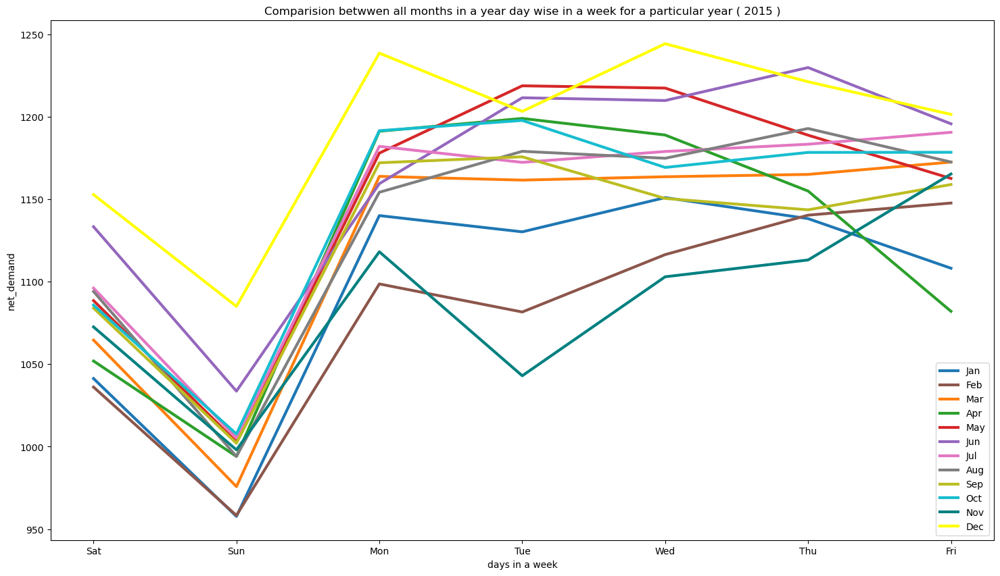

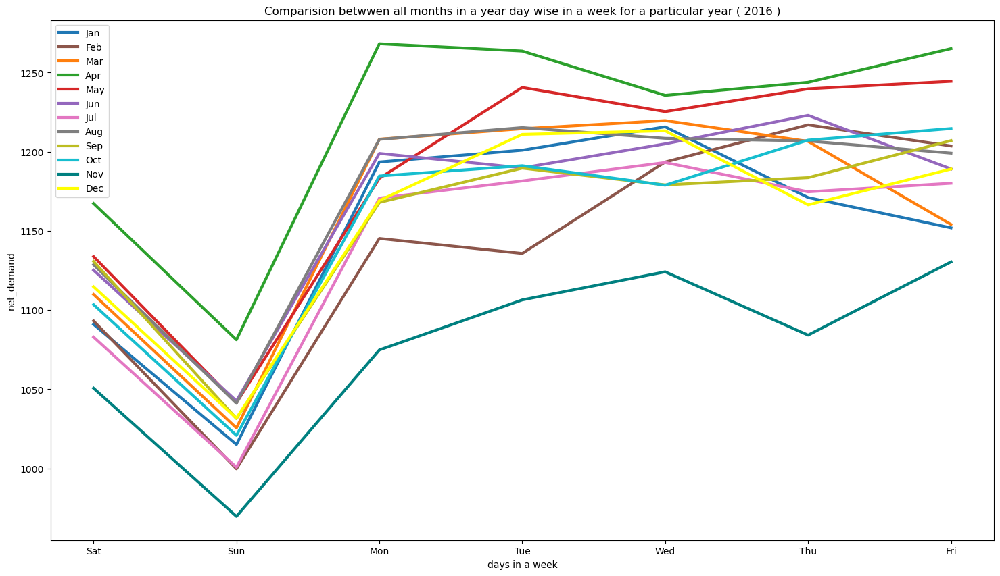

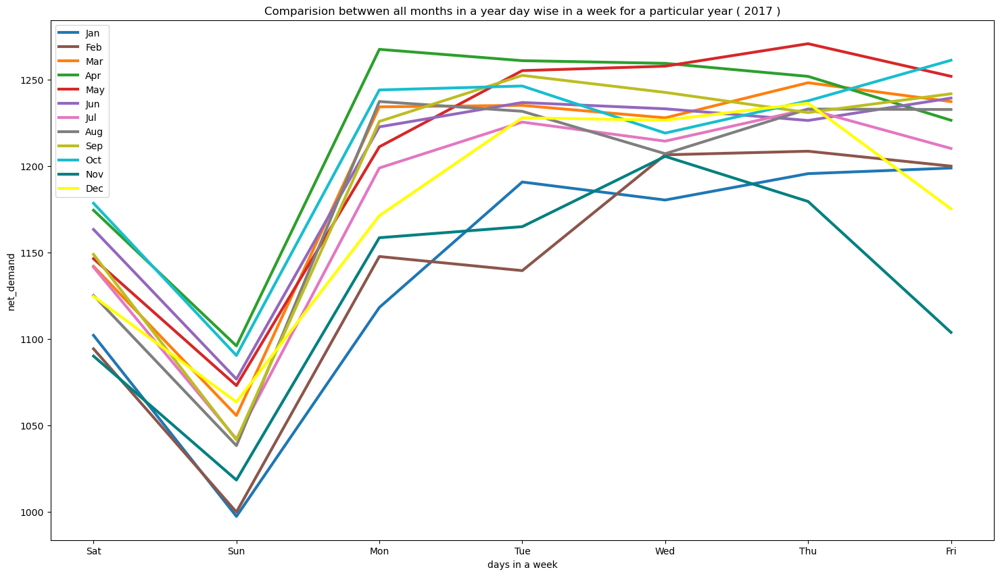

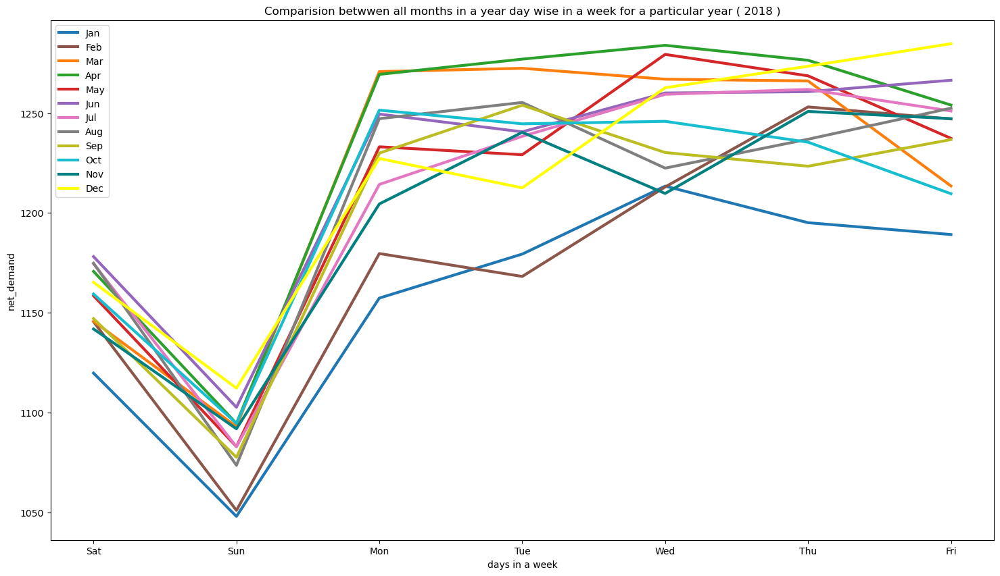

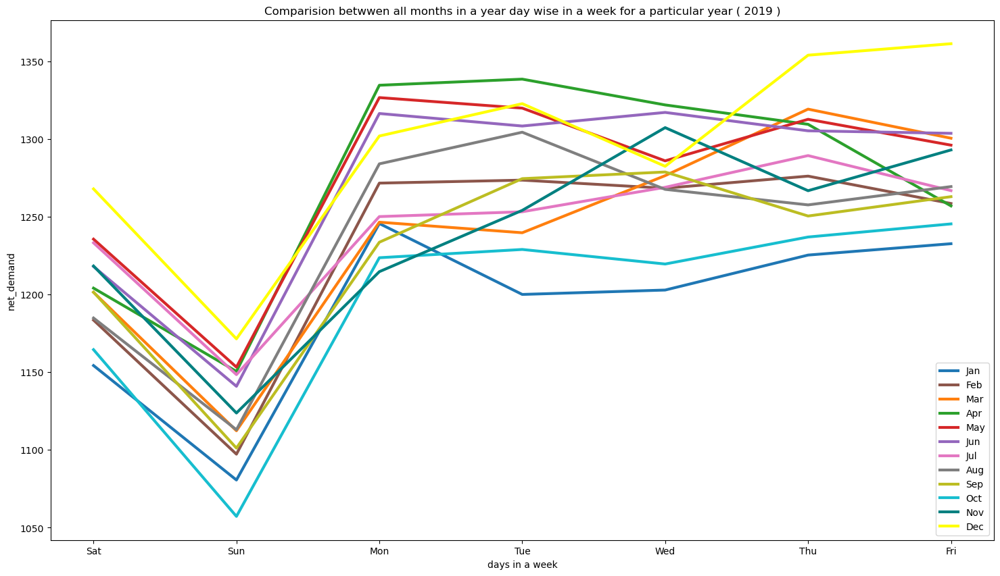

In [112]:
for i in range(len(years)):
    dfn_year=dfn[dfn.Year==years[i]]
#     display(dfn_year)
    plt.figure(figsize=(18,10))
    for j in range(len(month_num)):
#         display(dfn_year.loc[dfn_year.Month==month_num[j],:])
        plt.plot('DayName','Demand',data=dfn_year.loc[dfn_year.Month==month_num[j],:],label=months[j],color=rand_color[j],linewidth=3)
    plt.legend()
    plt.xlabel("days in a week")
    plt.ylabel("net_demand")
    plt.title("Comparision betwwen all months in a year day wise in a week for a particular year ( "+str(years[i])+' )')
    plt.show()


### 5 Years vs demand

In [113]:
X_year

,net_demand
datetime,
2015-12-31,1131.643003
2016-12-31,1156.901467
2017-12-31,1182.477678
2018-12-31,1205.676767
2019-12-31,1244.098722


Text(0.5, 1.0, 'Yearwise Demand Plot')

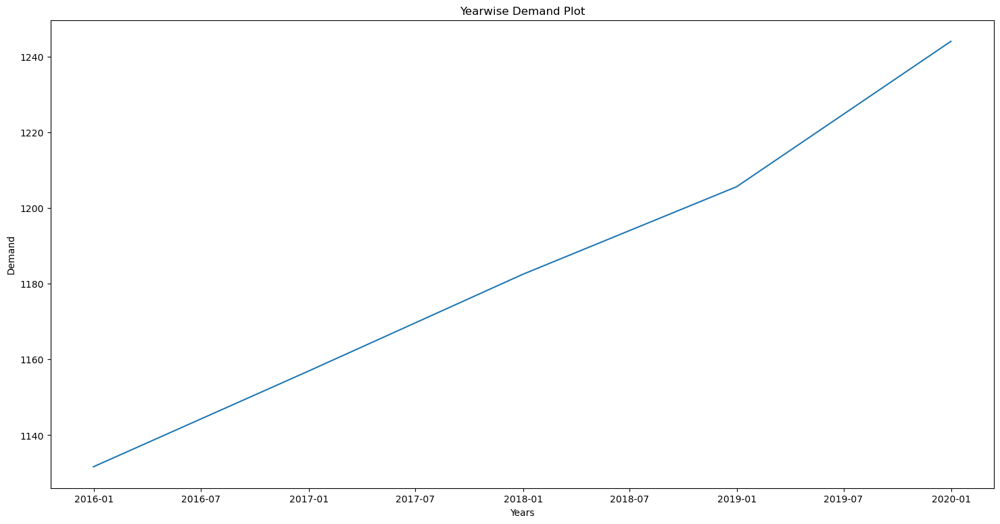

In [114]:
plt.figure(figsize=(18,9))
plt.plot(X_year)
plt.xlabel("Years")
plt.ylabel("Demand")
plt.title("Yearwise Demand Plot")

### 7 day vs demand

In [115]:
X['DayName']=[d.strftime('%a') for d in X.datetime]

In [116]:
s=X.groupby('DayName')

Text(0.5, 1.0, 'Daywise Demand Plot')

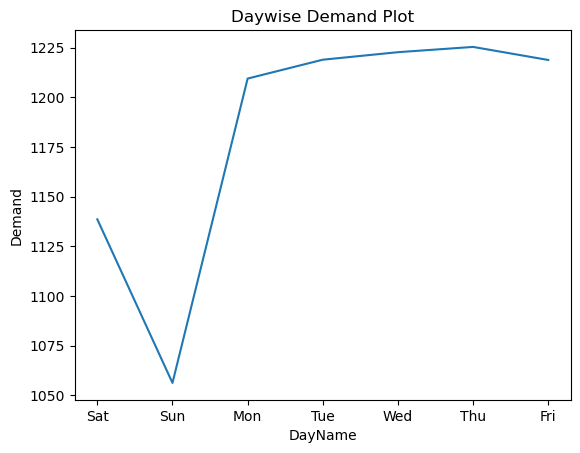

In [117]:
dem=[]
for i in day_name:
    s1=s.get_group(i)['net_demand'].mean()
    dem.append(s1)
plt.plot(day_name,dem)
plt.xlabel("DayName")
plt.ylabel("Demand")
plt.title("Daywise Demand Plot")

### 12 Month vs demand

In [118]:
X.head()

,datetime,net_demand,DayName
0,2015-01-03 01:00:00,970.345000,Sat
1,2015-01-03 02:00:00,912.175500,Sat
2,2015-01-03 03:00:00,900.268800,Sat
3,2015-01-03 04:00:00,889.953800,Sat
4,2015-01-03 05:00:00,1043.898189,Sat


In [119]:
X['Month']=[d.strftime('%b') for d in X.datetime]

In [120]:
s=X.groupby('Month')

In [121]:
months

array(['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep',
       'Oct', 'Nov', 'Dec'], dtype=object)

Text(0.5, 1.0, 'Monthwise Demand Plot')

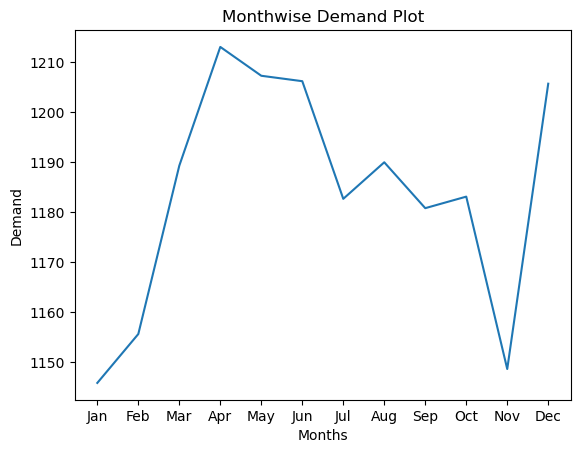

In [122]:
dem=[]
for i in months:
    s1=s.get_group(i)['net_demand'].mean()
    dem.append(s1)
plt.plot(months,dem)
plt.xlabel("Months")
plt.ylabel("Demand")
plt.title("Monthwise Demand Plot")

### 24 hours vs demand

In [123]:
X.head(2)

,datetime,net_demand,DayName,Month
0,2015-01-03 01:00:00,970.3450,Sat,Jan
1,2015-01-03 02:00:00,912.1755,Sat,Jan


In [124]:
X['Hour']=[d.hour for d in X.datetime]

In [125]:
X.head(2)

,datetime,net_demand,DayName,Month,Hour
0,2015-01-03 01:00:00,970.3450,Sat,Jan,1
1,2015-01-03 02:00:00,912.1755,Sat,Jan,2


In [126]:
hours=X['Hour'].unique()
hours.sort()

In [127]:
s=X.groupby('Hour')

Text(0.5, 1.0, 'Hourwise Demand Plot')

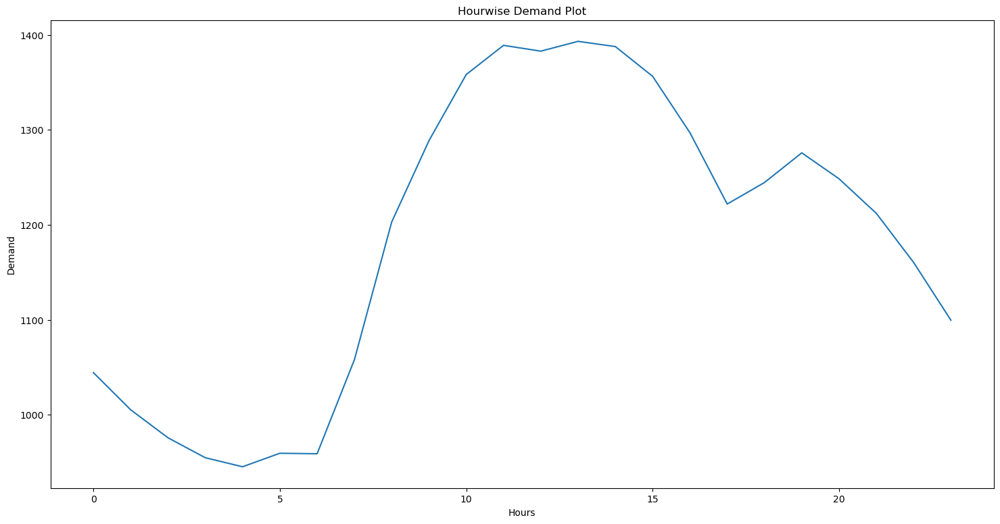

In [128]:
plt.figure(figsize=(18,9))
dem=[]
for i in hours:
    s1=s.get_group(i)['net_demand'].mean()
    dem.append(s1)
plt.plot(hours,dem)
plt.xlabel("Hours")
plt.ylabel("Demand")
plt.title("Hourwise Demand Plot")

# Line Plot 

In [129]:
X
X_lp = X.copy()
X_lp.set_index('datetime', inplace=True)
X_lp

,net_demand,DayName,Month,Hour
datetime,,,,
2015-01-03 01:00:00,970.345000,Sat,Jan,1
2015-01-03 02:00:00,912.175500,Sat,Jan,2
2015-01-03 03:00:00,900.268800,Sat,Jan,3
2015-01-03 04:00:00,889.953800,Sat,Jan,4
2015-01-03 05:00:00,1043.898189,Sat,Jan,5
...,...,...,...,...
2019-12-31 19:00:00,1301.606500,Tue,Dec,19
2019-12-31 20:00:00,1250.963400,Tue,Dec,20
2019-12-31 21:00:00,1193.680200,Tue,Dec,21


<class 'pandas.core.series.Series'>


<Figure size 1800x900 with 0 Axes>

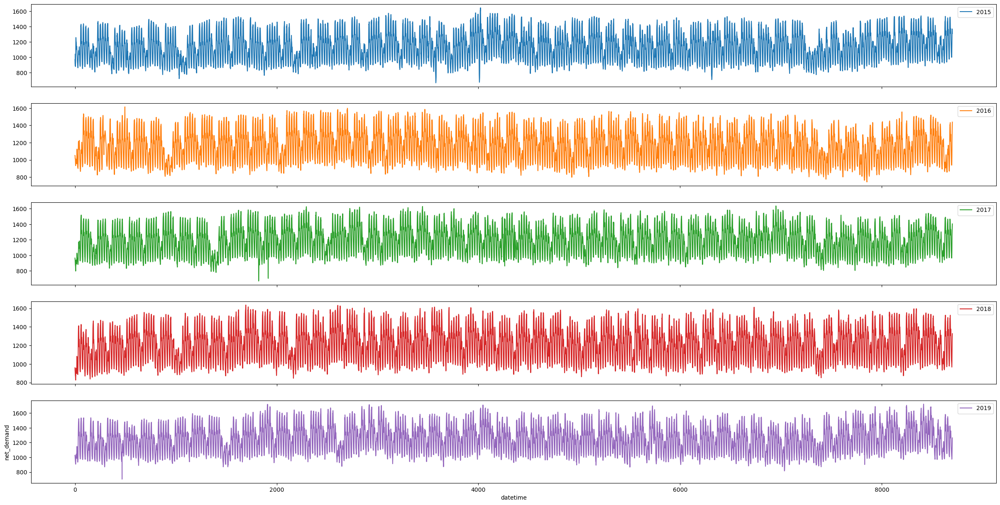

In [130]:
from pandas import Grouper
X_lp = X.copy()
X_lp.set_index('datetime', inplace=True)
X_lp = X_lp[X_lp.index.year != 2020]
X_lp=X_lp['net_demand']
print(type(X_lp))
groups = X_lp.groupby(Grouper(freq='A'))
years = pd.DataFrame()
for name, group in groups:
    years[name.year] = group.values[:8700]
plt.figure(figsize=(18,9))
years.plot(subplots=True,figsize=(30,15))
plt.xlabel("datetime")
plt.ylabel("net_demand")
plt.show()

# Histogram and desnsity plot with inference

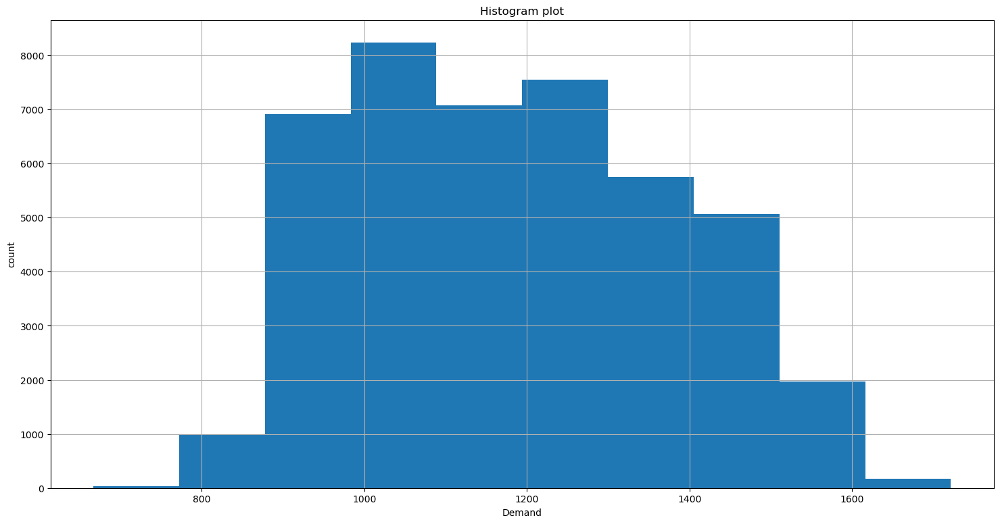

In [131]:
plt.figure(figsize=(18,9))
X['net_demand'].hist()
plt.xlabel("Demand")
plt.ylabel("count")
plt.title("Histogram plot")
plt.show()

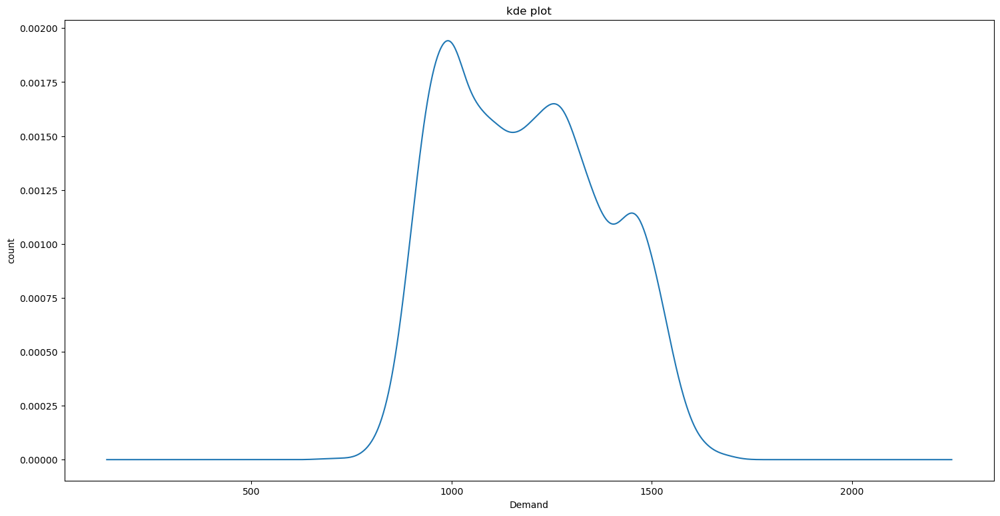

In [132]:
plt.figure(figsize=(18,9))
X['net_demand'].plot(kind='kde')
plt.xlabel("Demand")
plt.ylabel("count")
plt.title("kde plot")
plt.show()

# Various Box Plot and inference 

In [133]:
X['Year']=[d.year for d in X.datetime]
X['Day']=[d.day for d in X.datetime]
X

,datetime,net_demand,DayName,Month,Hour,Year,Day
0,2015-01-03 01:00:00,970.345000,Sat,Jan,1,2015,3
1,2015-01-03 02:00:00,912.175500,Sat,Jan,2,2015,3
2,2015-01-03 03:00:00,900.268800,Sat,Jan,3,2015,3
3,2015-01-03 04:00:00,889.953800,Sat,Jan,4,2015,3
4,2015-01-03 05:00:00,1043.898189,Sat,Jan,5,2015,3
...,...,...,...,...,...,...,...
43770,2019-12-31 19:00:00,1301.606500,Tue,Dec,19,2019,31
43771,2019-12-31 20:00:00,1250.963400,Tue,Dec,20,2019,31
43772,2019-12-31 21:00:00,1193.680200,Tue,Dec,21,2019,31
43773,2019-12-31 22:00:00,1130.457500,Tue,Dec,22,2019,31


### 1. Boxplot

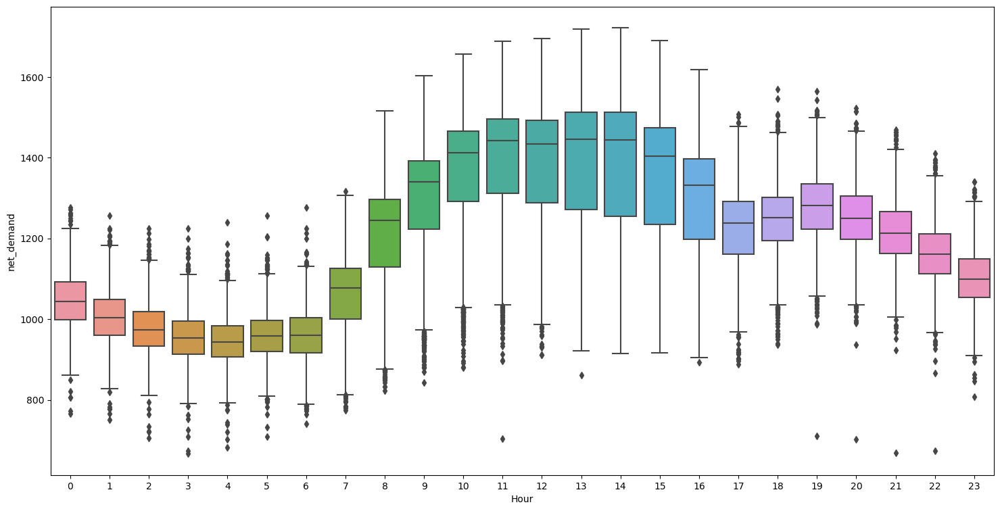

In [134]:
plt.figure(figsize=(18,9))
sns.boxplot(x='Hour',y='net_demand',data=X)
plt.show()

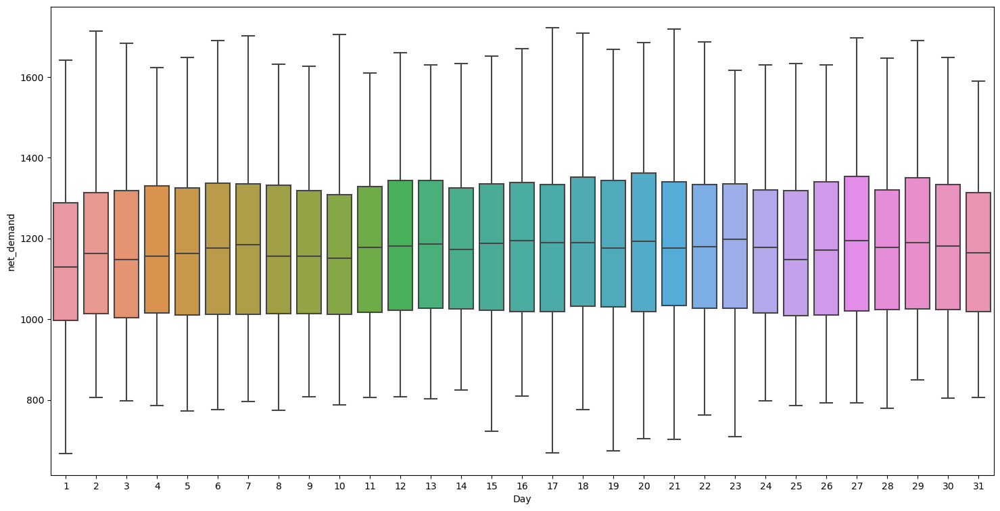

In [135]:
plt.figure(figsize=(18,9))
sns.boxplot(x='Day',y='net_demand',data=X)
plt.show()

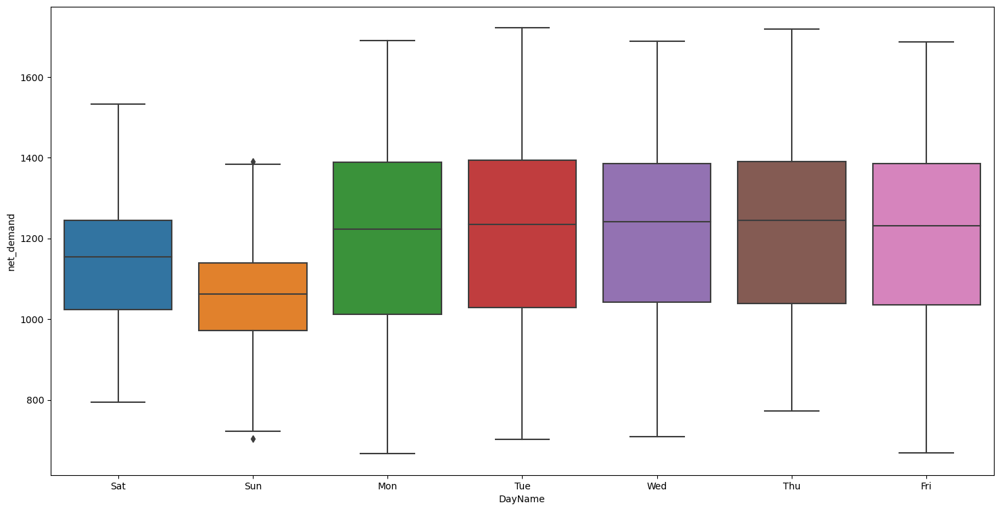

In [136]:
plt.figure(figsize=(18,9))
sns.boxplot(x='DayName',y='net_demand',data=X)
plt.show()

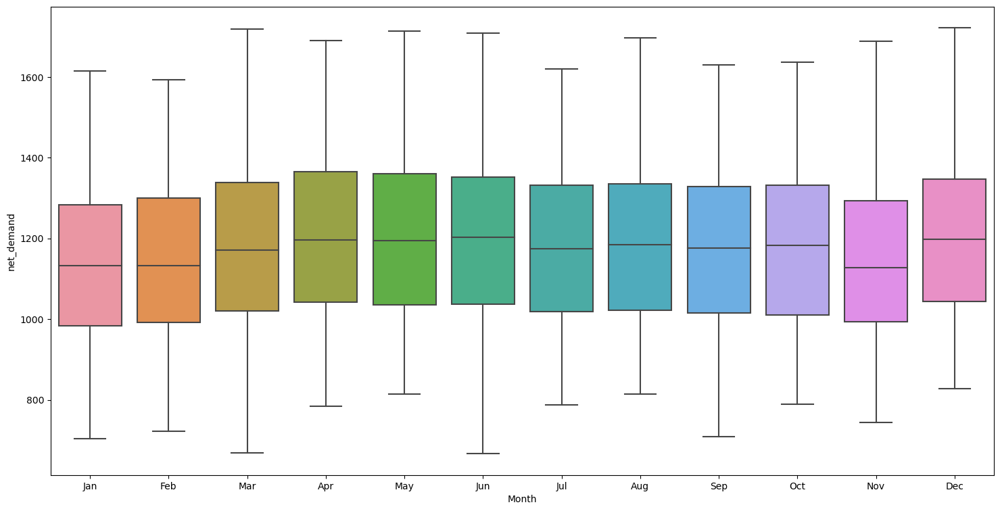

In [137]:
plt.figure(figsize=(18,9))
sns.boxplot(x='Month',y='net_demand',data=X)
plt.show()

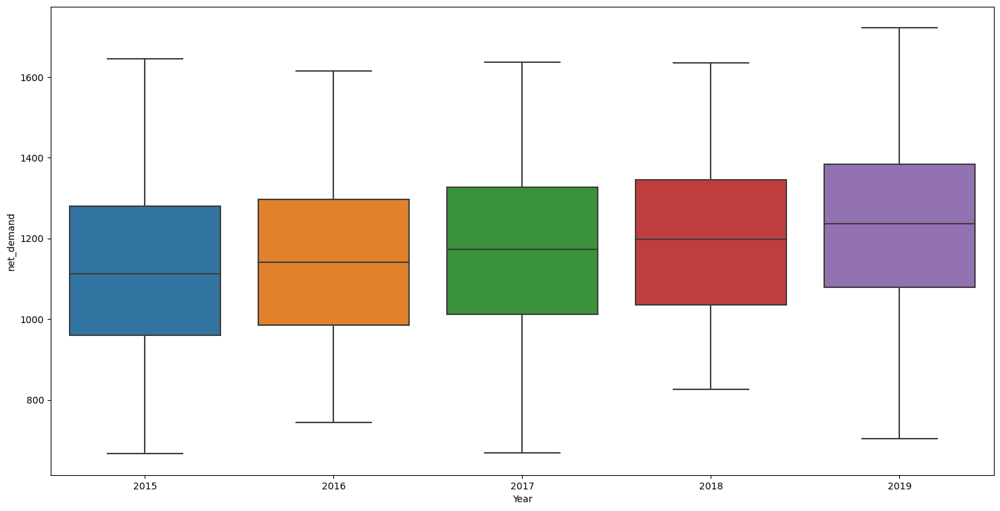

In [138]:
plt.figure(figsize=(18,9))
sns.boxplot(x='Year',y='net_demand',data=X)
plt.show()

### 2. Stripplot

<AxesSubplot:xlabel='Hour', ylabel='net_demand'>

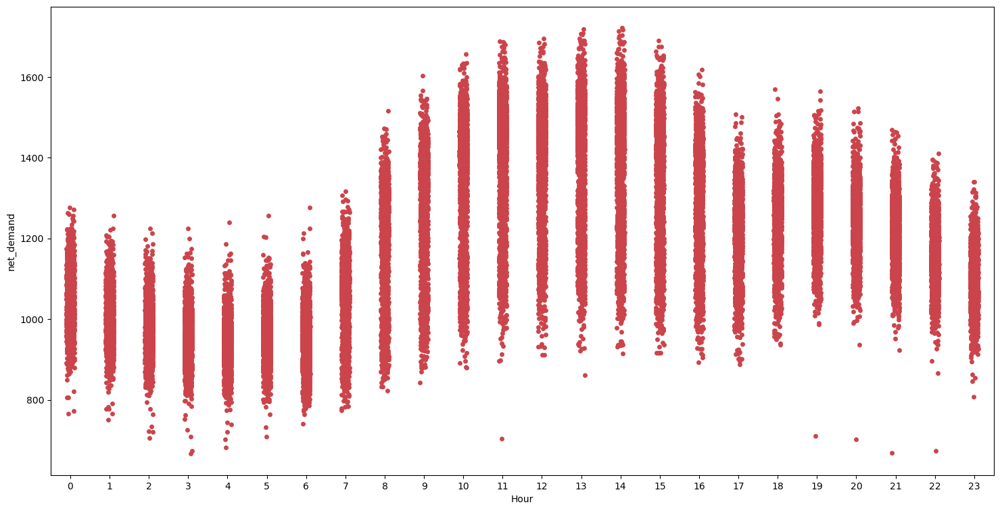

In [139]:
plt.figure(figsize=(18,9))
sns.stripplot(data=X,x='Hour', y='net_demand',color='#cc444b')

<AxesSubplot:xlabel='Day', ylabel='net_demand'>

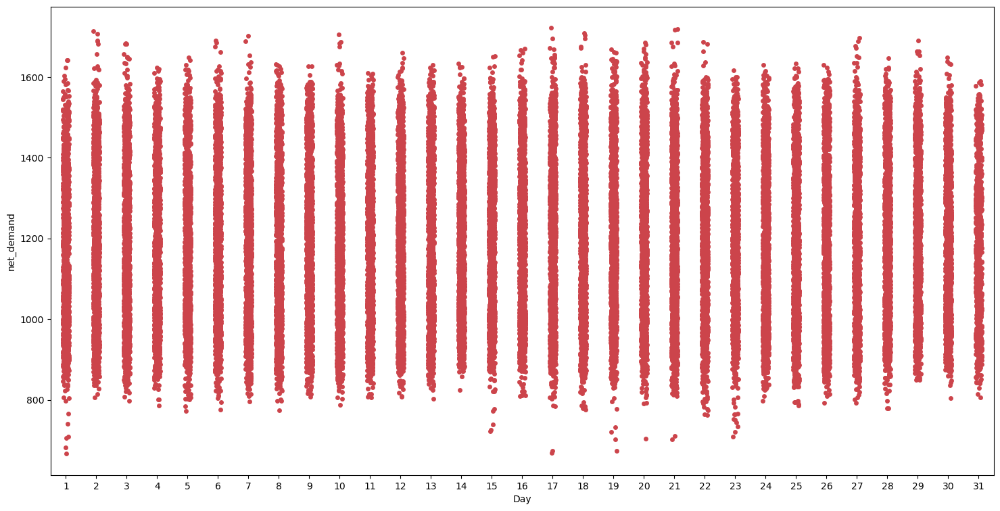

In [140]:
plt.figure(figsize=(18,9))
sns.stripplot(data=X,x='Day', y='net_demand',color='#cc444b')

<AxesSubplot:xlabel='DayName', ylabel='net_demand'>

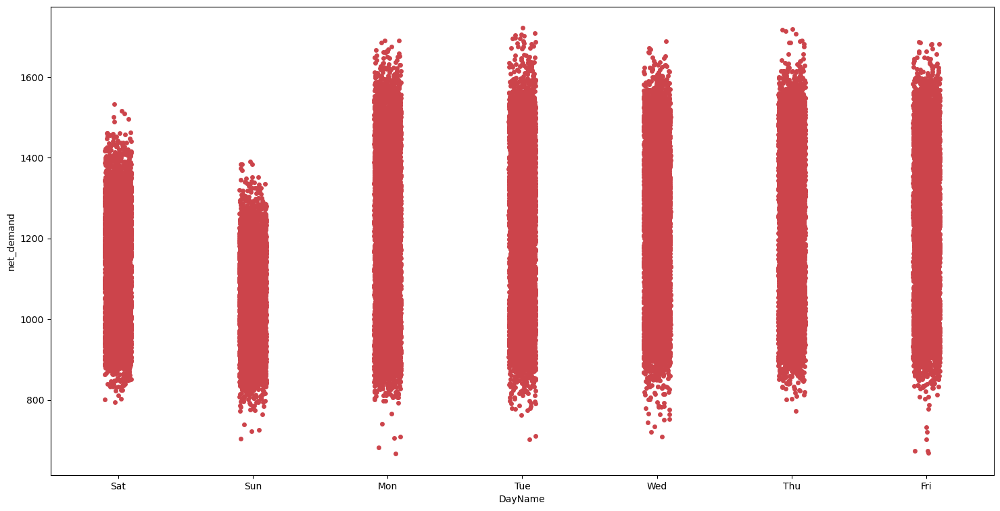

In [141]:
plt.figure(figsize=(18,9))
sns.stripplot(data=X,x='DayName', y='net_demand',color='#cc444b')

<AxesSubplot:xlabel='Month', ylabel='net_demand'>

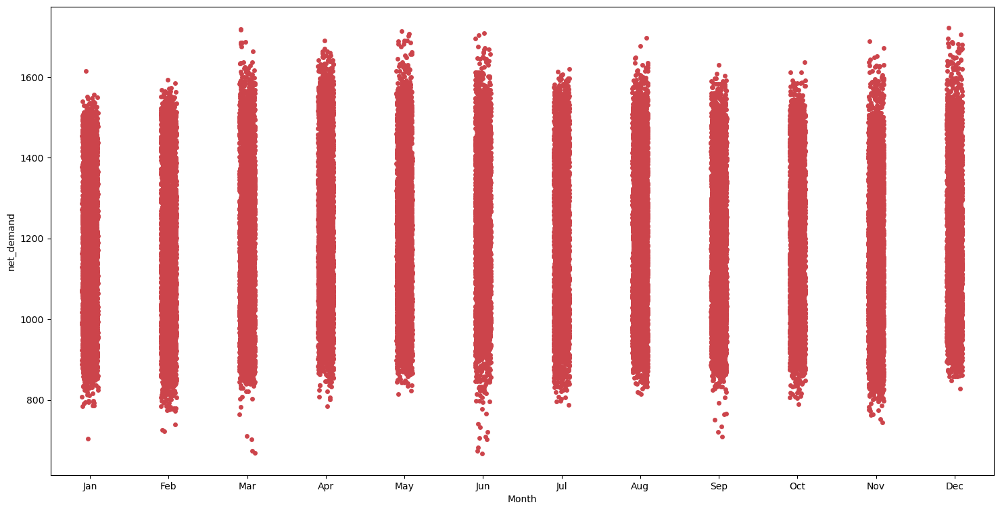

In [142]:
plt.figure(figsize=(18,9))
sns.stripplot(data=X,x='Month', y='net_demand',color='#cc444b')

<AxesSubplot:xlabel='Year', ylabel='net_demand'>

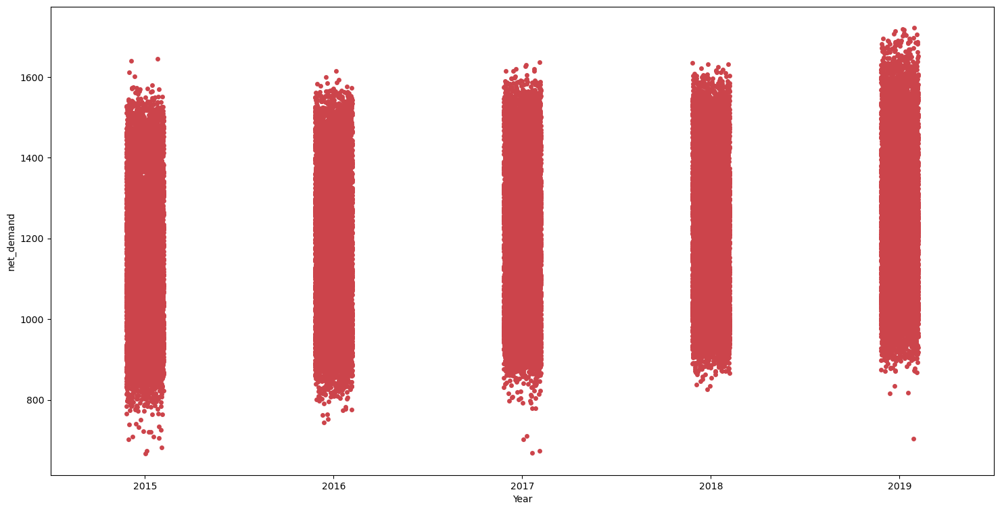

In [143]:
plt.figure(figsize=(18,9))
sns.stripplot(data=X,x='Year', y='net_demand',color='#cc444b')

### 3. Barplot

<AxesSubplot:xlabel='Hour', ylabel='net_demand'>

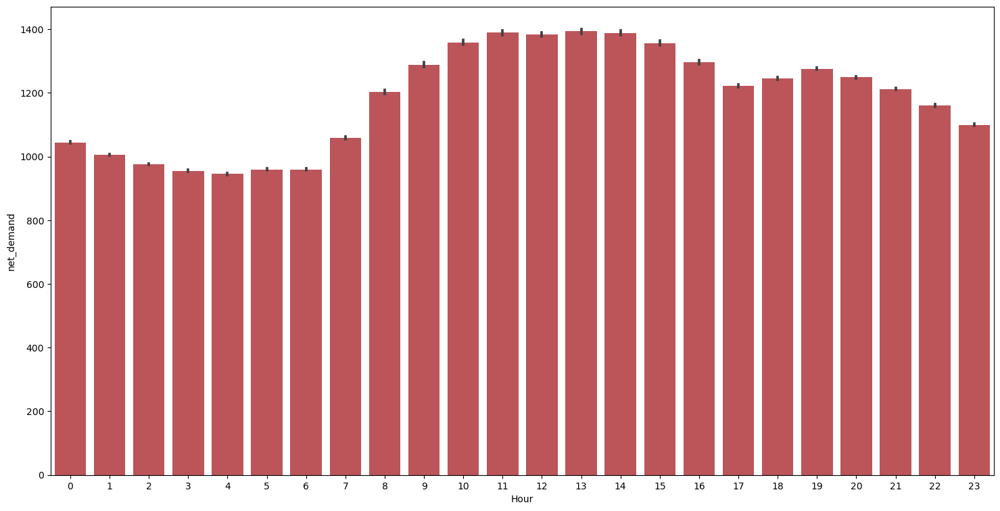

In [144]:
plt.figure(figsize=(18,9))
sns.barplot(data=X,x='Hour', y='net_demand',color='#cc444b')

<AxesSubplot:xlabel='Day', ylabel='net_demand'>

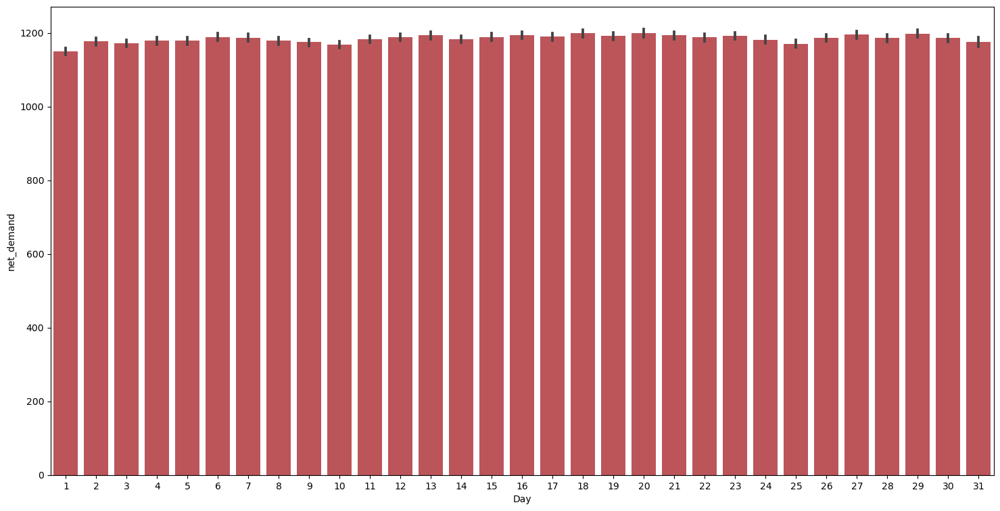

In [145]:
plt.figure(figsize=(18,9))
sns.barplot(data=X,x='Day', y='net_demand',color='#cc444b')

<AxesSubplot:xlabel='DayName', ylabel='net_demand'>

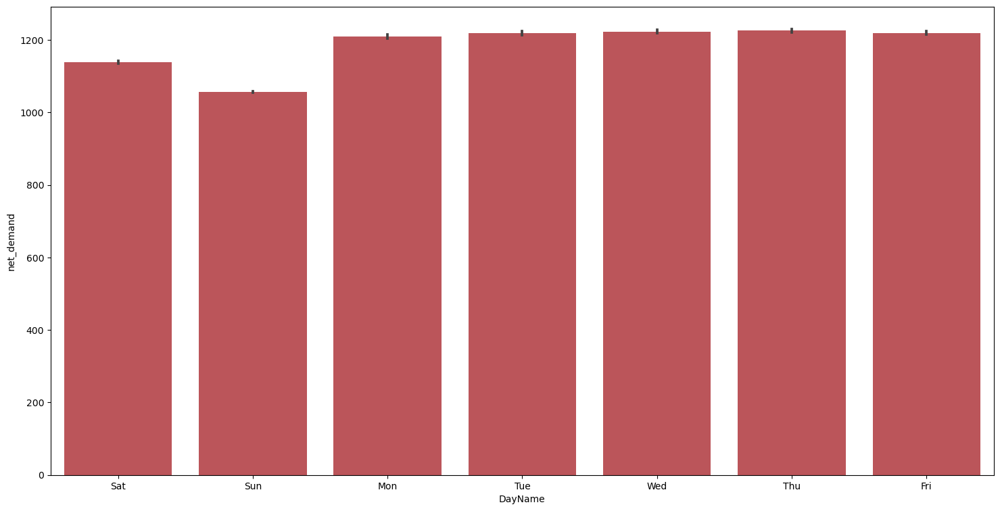

In [146]:
plt.figure(figsize=(18,9))
sns.barplot(data=X,x='DayName', y='net_demand',color='#cc444b')

<AxesSubplot:xlabel='Month', ylabel='net_demand'>

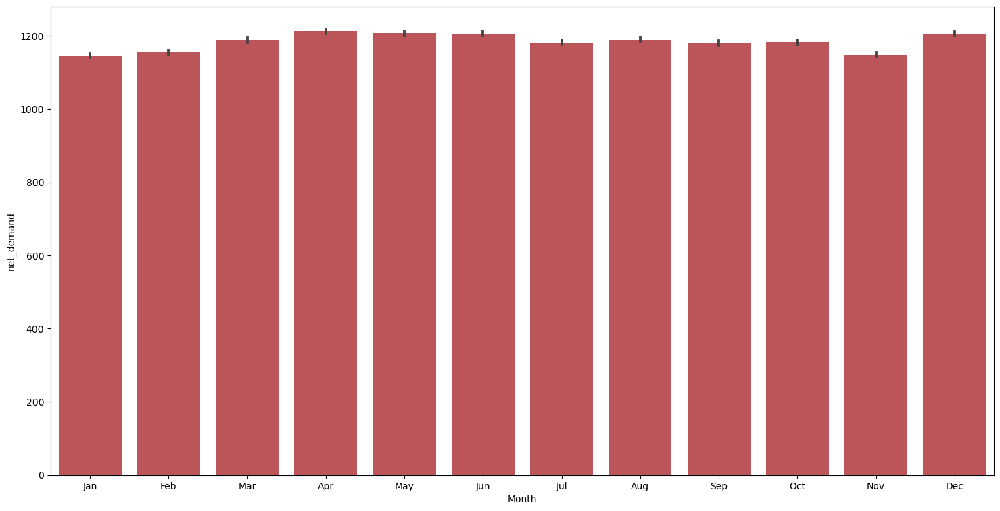

In [147]:
plt.figure(figsize=(18,9))
sns.barplot(data=X,x='Month', y='net_demand',color='#cc444b')

<AxesSubplot:xlabel='Year', ylabel='net_demand'>

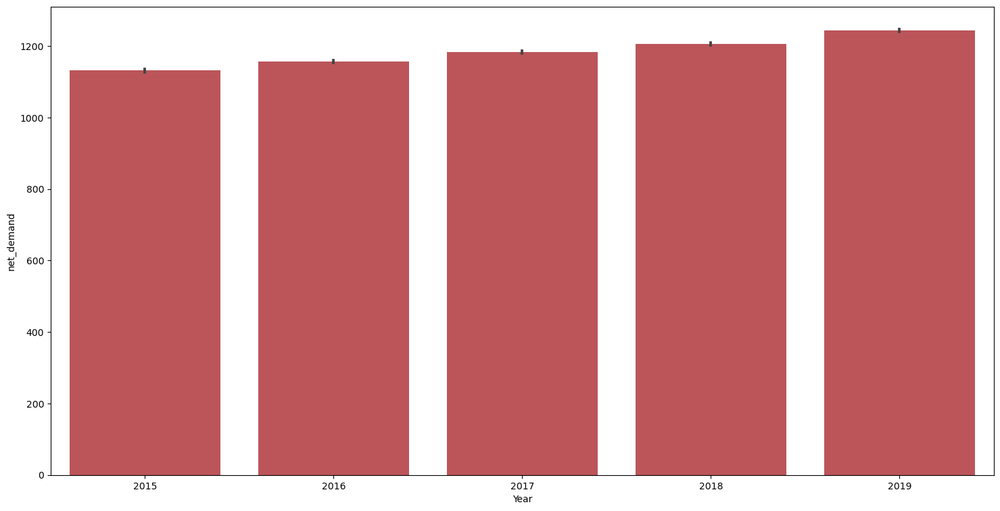

In [148]:
plt.figure(figsize=(18,9))
sns.barplot(data=X,x='Year', y='net_demand',color='#cc444b')

### 4. Violinplot

<AxesSubplot:xlabel='Hour', ylabel='net_demand'>

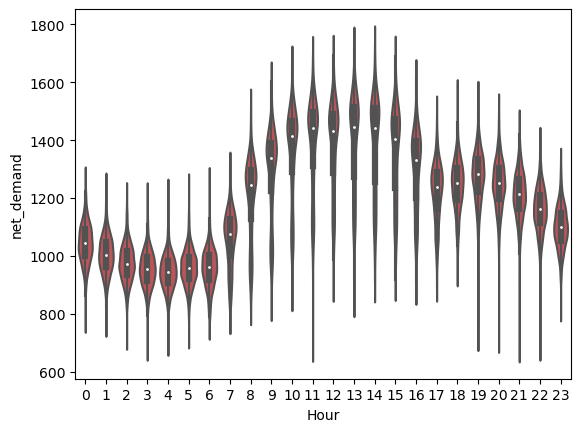

In [149]:
 sns.violinplot(data=X, x='Hour', y='net_demand', color='#cc444b')

<AxesSubplot:xlabel='Day', ylabel='net_demand'>

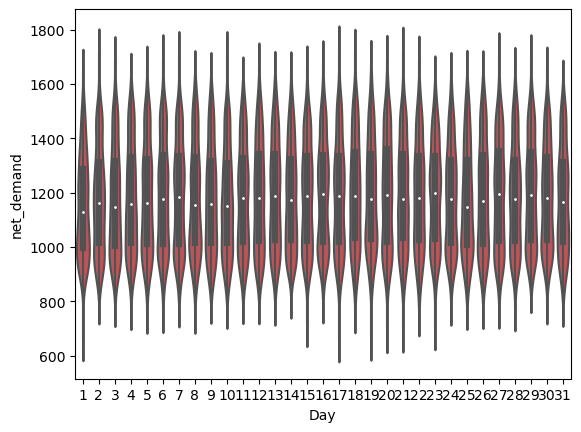

In [150]:
 sns.violinplot(data=X, x='Day', y='net_demand', color='#cc444b')

<AxesSubplot:xlabel='DayName', ylabel='net_demand'>

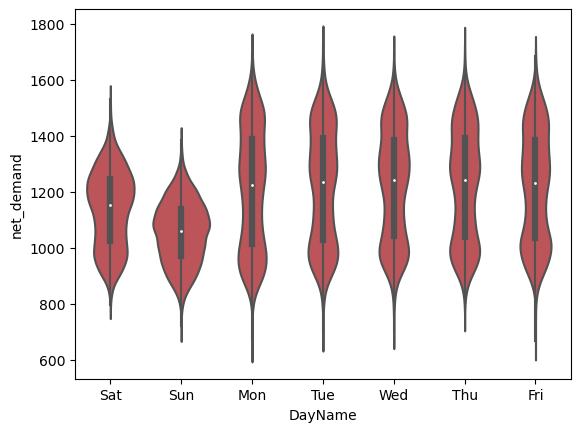

In [151]:
 sns.violinplot(data=X, x='DayName', y='net_demand', color='#cc444b')

<AxesSubplot:xlabel='Month', ylabel='net_demand'>

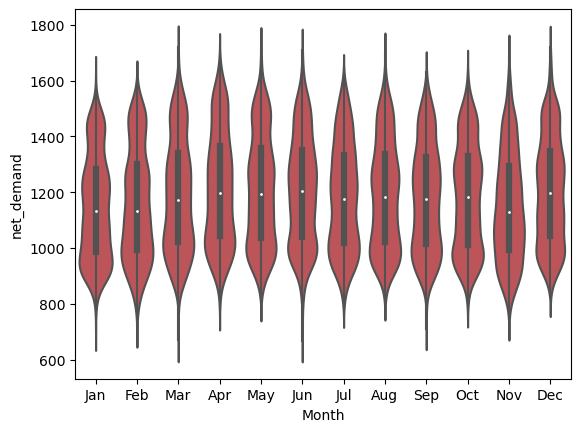

In [152]:
 sns.violinplot(data=X, x='Month', y='net_demand', color='#cc444b')

<AxesSubplot:xlabel='Year', ylabel='net_demand'>

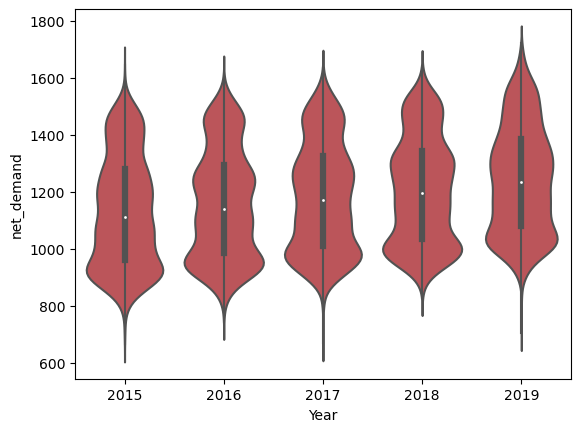

In [153]:
 sns.violinplot(data=X, x='Year', y='net_demand', color='#cc444b')

## ACF Plot

<AxesSubplot:xlabel='Lag', ylabel='Autocorrelation'>

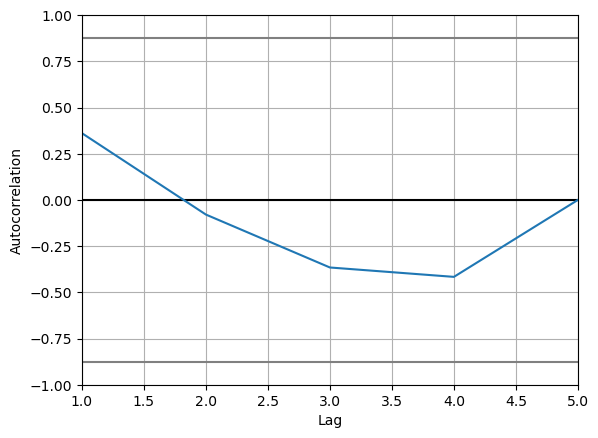

In [154]:
from pandas.plotting import autocorrelation_plot
y=X.copy()
y.set_index('datetime', inplace=True)
y=y.resample('Y').mean()
y=y['net_demand']
autocorrelation_plot(y)

<AxesSubplot:xlabel='Lag', ylabel='Autocorrelation'>

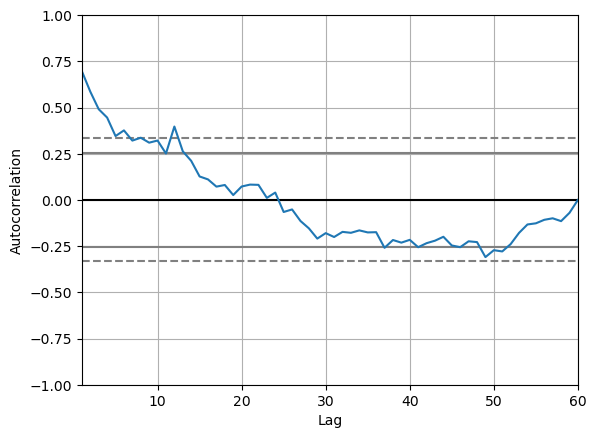

In [155]:
from pandas.plotting import autocorrelation_plot
y=X.copy()
y.set_index('datetime', inplace=True)
y=y.resample('M').mean()
y=y['net_demand']
autocorrelation_plot(y)

<AxesSubplot:xlabel='Lag', ylabel='Autocorrelation'>

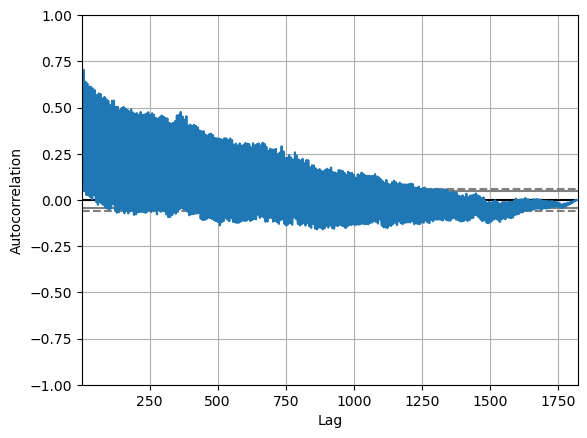

In [156]:
from pandas.plotting import autocorrelation_plot
y=X.copy()
y.set_index('datetime', inplace=True)
y=y.resample('D').mean()
y=y['net_demand']
autocorrelation_plot(y)

In [157]:
X.set_index('datetime',inplace=True)

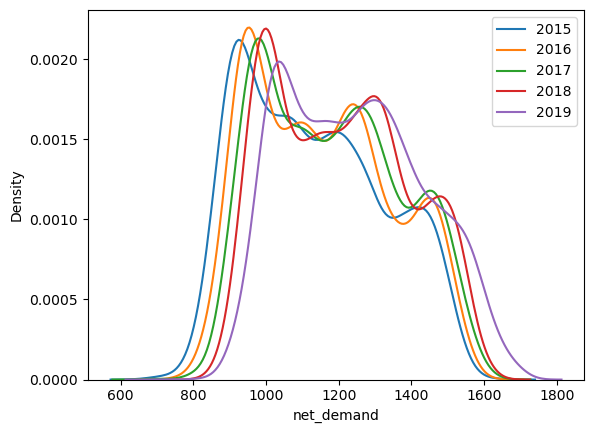

In [158]:
X_2015=X.loc[X.index.year==2015]
X_2016=X.loc[X.index.year==2016]
X_2017=X.loc[X.index.year==2017]
X_2018=X.loc[X.index.year==2018]
X_2019=X.loc[X.index.year==2019]
sns.kdeplot(X_2015['net_demand'],label='2015')
sns.kdeplot(X_2016['net_demand'],label='2016')
sns.kdeplot(X_2017['net_demand'],label='2017')
sns.kdeplot(X_2018['net_demand'],label='2018')
sns.kdeplot(X_2019['net_demand'],label='2019')
plt.legend()

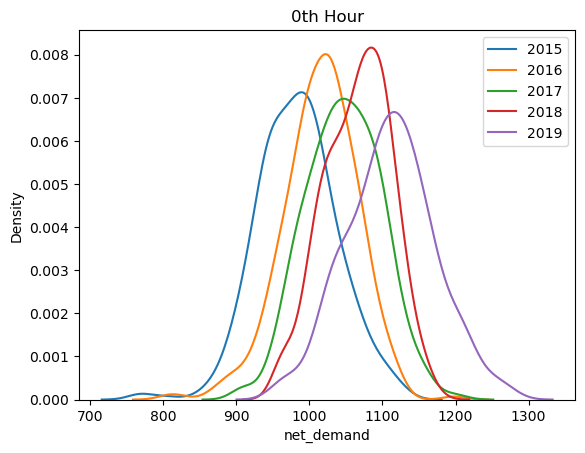

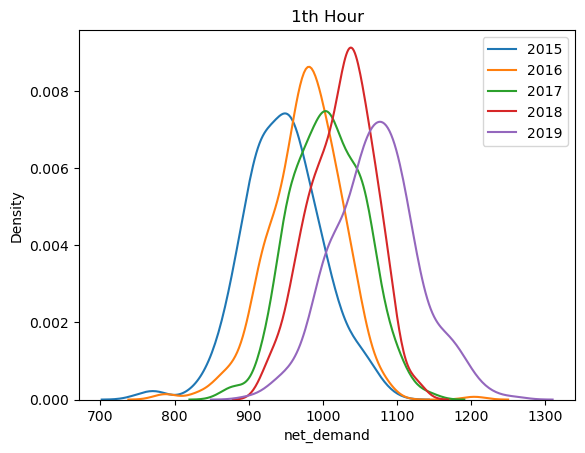

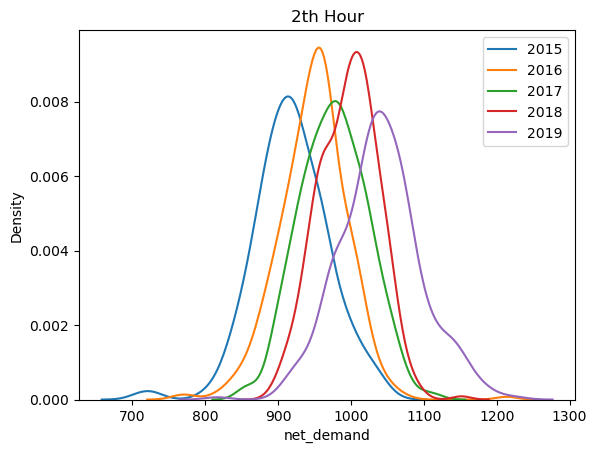

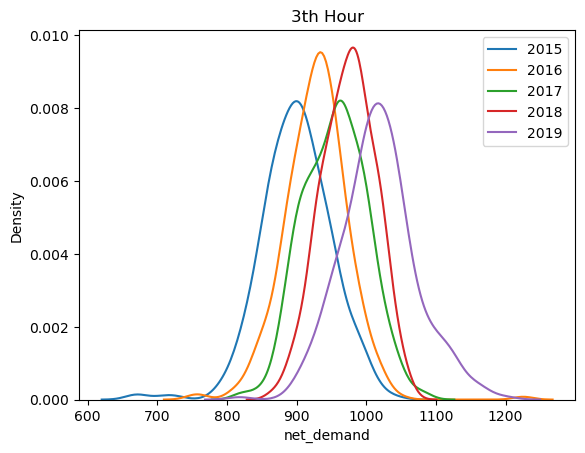

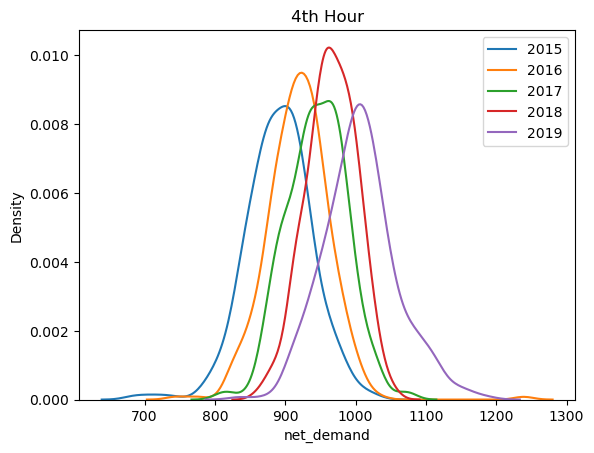

...

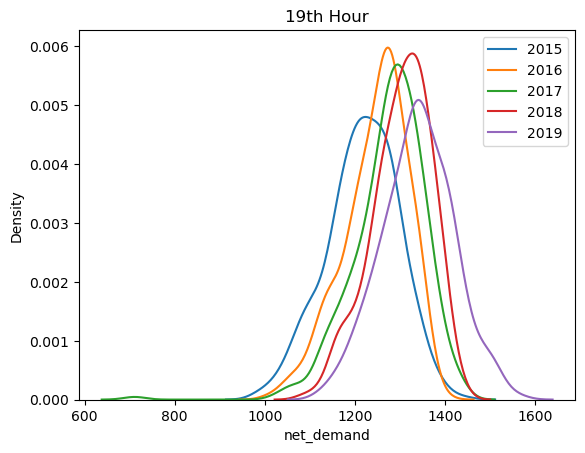

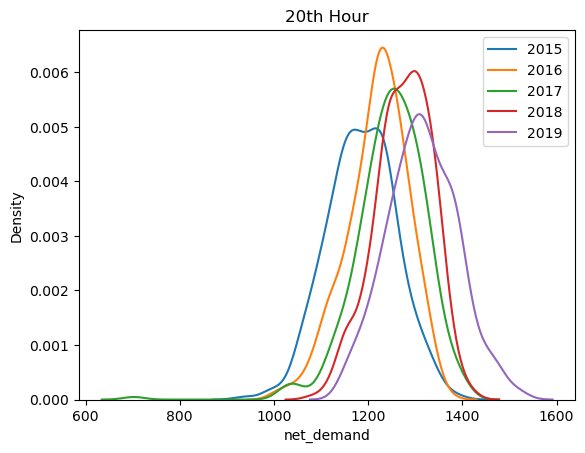

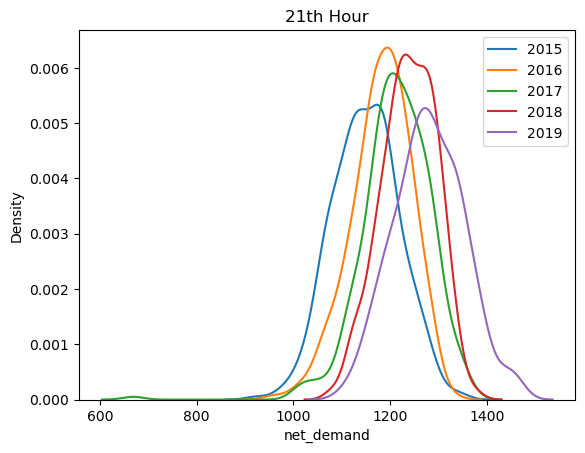

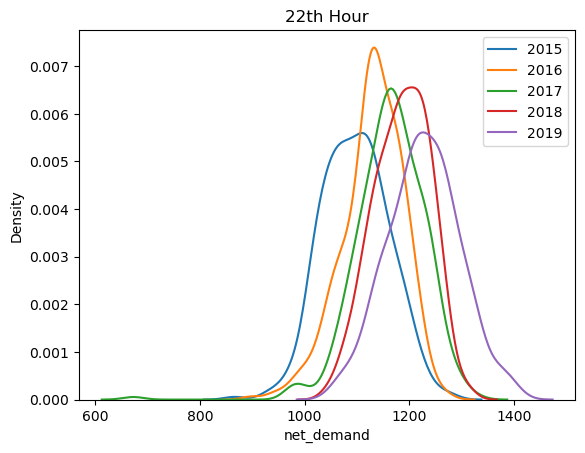

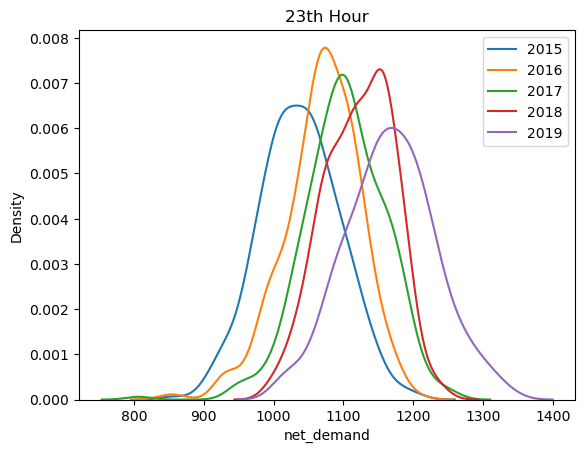

In [159]:
for i in hours:
    X_2015=X.loc[np.logical_and(X.index.year==2015, X.index.hour==i)]
    X_2016=X.loc[np.logical_and(X.index.year==2016, X.index.hour==i)]
    X_2017=X.loc[np.logical_and(X.index.year==2017, X.index.hour==i)]
    X_2018=X.loc[np.logical_and(X.index.year==2018, X.index.hour==i)]
    X_2019=X.loc[np.logical_and(X.index.year==2019, X.index.hour==i)]
    plt.title(str(i)+'th Hour')
    sns.kdeplot(X_2015['net_demand'],label='2015')
    sns.kdeplot(X_2016['net_demand'],label='2016')
    sns.kdeplot(X_2017['net_demand'],label='2017')
    sns.kdeplot(X_2018['net_demand'],label='2018')
    sns.kdeplot(X_2019['net_demand'],label='2019')
    plt.legend()
    plt.show()

# Resampling

In [160]:
X.reset_index(inplace=True)

In [161]:
dfr=X.iloc[:,:2]
dfr.head()

,datetime,net_demand
0,2015-01-03 01:00:00,970.345000
1,2015-01-03 02:00:00,912.175500
2,2015-01-03 03:00:00,900.268800
3,2015-01-03 04:00:00,889.953800
4,2015-01-03 05:00:00,1043.898189


In [162]:
dfr.set_index('datetime',inplace=True)

## Upsampling 

#### Hours to Minutes
For exmaple if we need minute wise demand then we need to upsample the data by using interpolation scheme to fill 

In [163]:
dfr_min=dfr.resample('1Min').mean()

In [164]:
dfr_min.head(61)

,net_demand
datetime,
2015-01-03 01:00:00,970.3450
2015-01-03 01:01:00,NaN
2015-01-03 01:02:00,NaN
2015-01-03 01:03:00,NaN
2015-01-03 01:04:00,NaN
...,...
2015-01-03 01:56:00,NaN
2015-01-03 01:57:00,NaN
2015-01-03 01:58:00,NaN


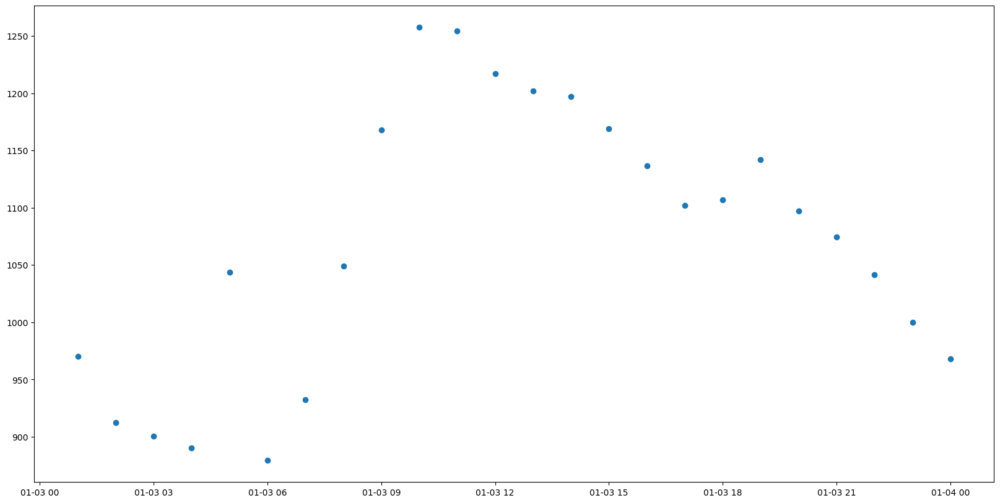

In [165]:
# This is for one day minute wise dat and we can see here we have got so much of nul values
plt.figure(figsize=(20,10))
plt.scatter(dfr_min.index[:1440],dfr_min.net_demand[:1440])
plt.show()

Interpolating the missing values

In [166]:
dfr_min_lin=dfr_min.interpolate(method='time')
dfr_min_lin.head(61)

,net_demand
datetime,
2015-01-03 01:00:00,970.345000
2015-01-03 01:01:00,969.375508
2015-01-03 01:02:00,968.406017
2015-01-03 01:03:00,967.436525
2015-01-03 01:04:00,966.467033
...,...
2015-01-03 01:56:00,916.053467
2015-01-03 01:57:00,915.083975
2015-01-03 01:58:00,914.114483


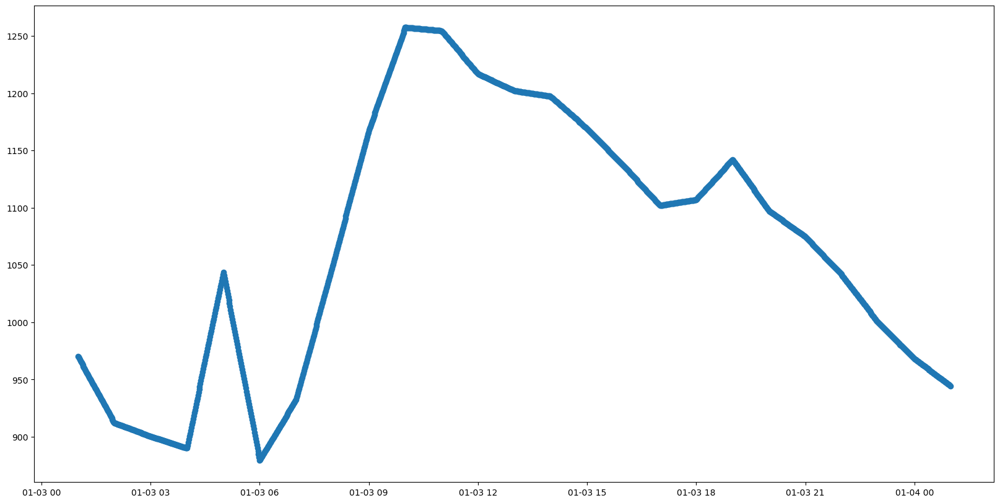

In [167]:
# here we are plotting interpolated upsampled data minutewise
plt.figure(figsize=(20,10))
plt.scatter(dfr_min_lin.index[:1440],dfr_min_lin.net_demand[:1440])
plt.show()

In [168]:
X.head()

,datetime,net_demand,DayName,Month,Hour,Year,Day
0,2015-01-03 01:00:00,970.345000,Sat,Jan,1,2015,3
1,2015-01-03 02:00:00,912.175500,Sat,Jan,2,2015,3
2,2015-01-03 03:00:00,900.268800,Sat,Jan,3,2015,3
3,2015-01-03 04:00:00,889.953800,Sat,Jan,4,2015,3
4,2015-01-03 05:00:00,1043.898189,Sat,Jan,5,2015,3


In [ ]:
dfr_min_spl=dfr_min.interpolate(method='spline',order=2)
dfr_min_spl.head(61)

In [ ]:
# here we are plotting interpolated upsampled data minutewise
plt.figure(figsize=(20,10))
plt.scatter(dfr_min_spl.index[:1440],dfr_min_spl.net_demand[:1440],label='spline')
plt.plot(dfr_min_spl.index[:1440],dfr_min_lin.net_demand[:1440],color='blue',linewidth=3,linestyle='dotted',label='linear')
plt.legend()
plt.show()

In [ ]:
# here we are plotting interpolated upsampled data minutewise
plt.figure(figsize=(20,10))
plt.scatter(dfr_min_spl.index,dfr_min_spl.net_demand,label='spline')
plt.plot(dfr_min_spl.index,dfr_min_lin.net_demand,color='blue',linewidth=3,linestyle='dotted',label='linear')
plt.legend()
plt.show()

### Down Sampling
Hours -> Days
Hours -> Week
Hours -> Month
Hours -> Quarter
Hours -> Year

In [ ]:
dfr_day=dfr.resample('D').mean()
dfr_week=dfr.resample('W').mean()
dfr_month=dfr.resample('M').mean()
dfr_quarter=dfr.resample('Q').mean()
dfr_year=dfr.resample('Y').mean()

In [ ]:
plt.figure(figsize=(18,9))
plt.plot(dfr_day,color='blue',label='Day')
plt.plot(dfr_week,color='yellow',label='Week',linewidth=3)
plt.plot(dfr_month,color='red',label='Month',linewidth=3)
plt.plot(dfr_quarter,color='green',label='Quarter',linewidth=4)
plt.plot(dfr_year,color='black',label='Year',linewidth=4)
plt.legend()
plt.show()

In [ ]:
dfr_day=dfr.resample('D').sum()
dfr_week=dfr.resample('W').sum()
dfr_month=dfr.resample('M').sum()
dfr_quarter=dfr.resample('Q').sum()
dfr_year=dfr.resample('Y').sum()

In [ ]:
plt.figure(figsize=(18,9))
plt.plot(dfr_day,color='blue',label='Day')
plt.plot(dfr_week,color='yellow',label='Week',linewidth=3)
plt.plot(dfr_month,color='red',label='Month',linewidth=3)
plt.plot(dfr_quarter,color='green',label='Quarter',linewidth=4)
plt.plot(dfr_year,color='black',label='Year',linewidth=4)
plt.legend()
plt.show()

In [ ]:
plt.plot(dfr_year,color='black',label='Year',linewidth=4)

# Stationarity Check

In [ ]:
def stationarity_check(TS):
    
    # Import adfuller
    from statsmodels.tsa.stattools import adfuller
    
    # Calculate rolling statistics
    rolmean = TS.rolling(window = 8, center = False).mean()
    rolstd = TS.rolling(window = 8, center = False).std()
    
    # Perform the Dickey Fuller Test
    dftest = adfuller(TS) # change the passengers column as required 
    
    # Print Dickey-Fuller test results
    print ('Results of Dickey-Fuller Test:')

    dfoutput = pd.Series(dftest[0:4], index=['Test Statistic','p-value','#Lags Used','Number of Observations Used'])
    for key,value in dftest[4].items():
        dfoutput['Critical Value (%s)'%key] = value
    print (dfoutput)
    



In [ ]:
# df_stat.head()

In [ ]:
df_stat=X.iloc[:,:2]
df_stat.set_index('datetime',inplace=True)

In [ ]:
X_year.head()

In [ ]:
stationarity_check(df_stat['net_demand'])

In [ ]:
stationarity_check(X_year['net_demand'])

In [ ]:
stationarity_check(X_quarter['net_demand'])

In [ ]:
stationarity_check(X_month['net_demand'])

In [ ]:
stationarity_check(X_week['net_demand'])

# Decomposition

In [ ]:
from statsmodels.tsa.seasonal import seasonal_decompose

In [ ]:
df_dec=X.iloc[:,:2]

In [ ]:
df_dec.set_index('datetime',inplace=True)

In [ ]:
df_dec.head()

### Additive

In [ ]:
def decompose(ts,model,period=None):
    result = seasonal_decompose(ts, model=model,period=period)
#     plt.figure(figsize=(12,6))
    plt.title('Trend')
    plt.plot(result.trend)
    plt.show()
#     plt.figure(figsize=(12,6))
    plt.title('Season')
    plt.plot(result.seasonal)
    plt.show()

In [ ]:
df_dec.head()

In [ ]:
decompose(df_dec,'additive')

In [ ]:
decompose(df_dec,'additive',365)

In [ ]:
decompose(df_dec,'additive',730)

In [ ]:
decompose(df_dec,'additive',8770)

In [ ]:
samp=df_dec[:24*7]
len(samp)

In [ ]:
decompose(samp,'additive')

In [ ]:
# df_day=df_dec.resample('D').mean()
# decompose(df_day[:1],'additive')
# df_dec.index

# Multiplicative

In [ ]:
decompose(df_dec,'multiplicative')

In [ ]:
decompose(df_dec,'multiplicative',365)

In [ ]:
decompose(df_dec,'multiplicative',730)

In [ ]:
decompose(df_dec,'multiplicative',8760)

In [ ]:
decompose(samp,'multiplicative')

# Naive Prediction Forecast 

### 1. Split The data

In [ ]:
df_naive=X.copy()
len(df_naive)

In [ ]:
df_naive.tail()

In [ ]:
df_naive.set_index('datetime')

In [ ]:
df_naive.Year.unique()

In [ ]:
df_naive.rename(columns = {'net_demand':'Demand'}, inplace = True)

In [ ]:
df_naive.columns

In [ ]:
X_train=df_naive[df_naive.Year!=2019]

In [ ]:
X_train.tail(1)

In [ ]:
X_test=df_naive[df_naive.Year==2019]
X_test.head()

### 2. Using Training Mean to predict

In [ ]:
predicted=X_train.mean()
pred=predicted[0]

In [ ]:
X_test['Train_Mean_Predicted'] = pred

In [ ]:
X_test.head()

In [ ]:
X_train.head()

In [ ]:
plt.figure(figsize=(18,9))
fig, ax = plt.subplots()
ax.plot(X_train.index, X_train['Demand'], 'g-.', label='Train')
ax.plot(X_test.index, X_test['Demand'], 'b-', label='Test')
ax.plot(X_test.index, X_test['Train_Mean_Predicted'], 'r--', label='Predicted')
ax.set_xlabel('Date')
ax.set_ylabel('Demand')

# Transformation

In [ ]:
dfr_month

In [ ]:
dfr_month_mean=dfr_month.copy()
dfr_month_mean.head()

In [ ]:
dfr_month_mean['Mean']=0
dfr_month_mean['Std']=0

In [ ]:
for i in range(len(dfr_month_mean)):
    me=dfr_month_mean.iloc[0:i+1,0].mean()
    st=dfr_month_mean.iloc[0:i+1,0].std()
    dfr_month_mean.iloc[[i],[1]] = me
    dfr_month_mean.iloc[[i],[2]] = st

In [ ]:
dfr_month_mean.head(10)

In [ ]:
plt.plot(dfr_month_mean['net_demand'],color='red')
plt.plot(dfr_month_mean['Mean'],color='blue')
# plt.plot(dfr_month_mean['Std'],color='green')

In [ ]:
 plt.plot(dfr_month_mean['Std'],color='green')

In [ ]:
decompose(dfr_month,'additive')

Here we can see size of seasonal component is 12
Mean changes over the time
Variance changes over the time

So we will try to transform this 

### Sqrt Transform

In [ ]:
# We can see trend is reduced but wasn't removed
from numpy import sqrt
sqrt_trans = sqrt(dfr_month)
plt.plot(dfr_month,color='blue')
plt.show()
plt.plot(sqrt_trans)
plt.show()
dfr_month.hist()

### Log Transform

In [ ]:
from numpy import log
log_trans = log(dfr_month)
plt.plot(log_trans)
plt.show()
dfr_month.hist()
plt.show()
log_trans.hist()

### Box Cox Transform

In [ ]:
from scipy.stats import boxcox 
boxcox_trans,l=boxcox(dfr_year['net_demand'])
plt.plot(boxcox_trans)
plt.show()